### [4.2] Data and Code:

In [1]:
from collections import Counter
import pandas as pd
import numpy as np
import warnings

warnings.filterwarnings("ignore")

In [2]:
data = pd.read_json('tops_fashion.json')

In [3]:
print ('Number of data points : ', data.shape[0], \
       'Number of features/variables:', data.shape[1])

Number of data points :  183138 Number of features/variables: 19


In [4]:
data.head()

,sku,asin,product_type_name,formatted_price,author,color,brand,publisher,availability,reviews,large_image_url,availability_type,small_image_url,editorial_review,title,model,medium_image_url,manufacturer,editorial_reivew
0,None,B016I2TS4W,SHIRT,None,None,None,FNC7C,None,None,"[False, https://www.amazon.com/reviews/iframe?...",https://images-na.ssl-images-amazon.com/images...,None,https://images-na.ssl-images-amazon.com/images...,Minions Como Superheroes Ironman Women's O Nec...,Minions Como Superheroes Ironman Long Sleeve R...,None,https://images-na.ssl-images-amazon.com/images...,None,NaN
1,None,B01N49AI08,SHIRT,None,None,None,FIG Clothing,None,None,"[False, https://www.amazon.com/reviews/iframe?...",https://images-na.ssl-images-amazon.com/images...,None,https://images-na.ssl-images-amazon.com/images...,Sizing runs on the small side. FIG® recommends...,FIG Clothing Womens Izo Tunic,None,https://images-na.ssl-images-amazon.com/images...,None,NaN
2,None,B01JDPCOHO,SHIRT,None,None,None,FIG Clothing,None,None,"[False, https://www.amazon.com/reviews/iframe?...",https://images-na.ssl-images-amazon.com/images...,None,https://images-na.ssl-images-amazon.com/images...,Sizing runs on the small side. FIG® recommends...,FIG Clothing Womens Won Top,None,https://images-na.ssl-images-amazon.com/images...,None,NaN
3,None,B01N19U5H5,SHIRT,None,None,None,Focal18,None,None,"[True, https://www.amazon.com/reviews/iframe?a...",https://images-na.ssl-images-amazon.com/images...,None,https://images-na.ssl-images-amazon.com/images...,100% Brand New & Fashion<br> Quantity: 1 Piece...,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None,https://images-na.ssl-images-amazon.com/images...,None,NaN
4,None,B004GSI2OS,SHIRT,$26.26,None,Onyx Black/ Stone,FeatherLite,None,Usually ships in 6-10 business days,"[False, https://www.amazon.com/reviews/iframe?...",https://images-na.ssl-images-amazon.com/images...,now,https://images-na.ssl-images-amazon.com/images...,,Featherlite Ladies' Long Sleeve Stain Resistan...,None,https://images-na.ssl-images-amazon.com/images...,None,NaN


In [5]:
data.columns

Index(['sku', 'asin', 'product_type_name', 'formatted_price', 'author',
       'color', 'brand', 'publisher', 'availability', 'reviews',
       'large_image_url', 'availability_type', 'small_image_url',
       'editorial_review', 'title', 'model', 'medium_image_url',
       'manufacturer', 'editorial_reivew'],
      dtype='object')

In [6]:
data = data[['asin', 'brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]

In [7]:
print ('Number of data points : ', data.shape[0], 
       'Number of features:', data.shape[1])
data.head()

Number of data points :  183138 Number of features: 7


,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


In [8]:
print(data['product_type_name'].describe())

count     183138
unique        72
top        SHIRT
freq      167794
Name: product_type_name, dtype: object


In [9]:
print(data['product_type_name'].unique())

['SHIRT' 'SWEATER' 'APPAREL' 'OUTDOOR_RECREATION_PRODUCT'
 'BOOKS_1973_AND_LATER' 'PANTS' 'HAT' 'SPORTING_GOODS' 'DRESS' 'UNDERWEAR'
 'SKIRT' 'OUTERWEAR' 'BRA' 'ACCESSORY' 'ART_SUPPLIES' 'SLEEPWEAR'
 'ORCA_SHIRT' 'HANDBAG' 'PET_SUPPLIES' 'SHOES' 'KITCHEN' 'ADULT_COSTUME'
 'HOME_BED_AND_BATH' 'MISC_OTHER' 'BLAZER' 'HEALTH_PERSONAL_CARE'
 'TOYS_AND_GAMES' 'SWIMWEAR' 'CONSUMER_ELECTRONICS' 'SHORTS' 'HOME'
 'AUTO_PART' 'OFFICE_PRODUCTS' 'ETHNIC_WEAR' 'BEAUTY'
 'INSTRUMENT_PARTS_AND_ACCESSORIES' 'POWERSPORTS_PROTECTIVE_GEAR' 'SHIRTS'
 'ABIS_APPAREL' 'AUTO_ACCESSORY' 'NONAPPARELMISC' 'TOOLS' 'BABY_PRODUCT'
 'SOCKSHOSIERY' 'POWERSPORTS_RIDING_SHIRT' 'EYEWEAR' 'SUIT'
 'OUTDOOR_LIVING' 'POWERSPORTS_RIDING_JACKET' 'HARDWARE' 'SAFETY_SUPPLY'
 'ABIS_DVD' 'VIDEO_DVD' 'GOLF_CLUB' 'MUSIC_POPULAR_VINYL'
 'HOME_FURNITURE_AND_DECOR' 'TABLET_COMPUTER' 'GUILD_ACCESSORIES'
 'ABIS_SPORTS' 'ART_AND_CRAFT_SUPPLY' 'BAG' 'MECHANICAL_COMPONENTS'
 'SOUND_AND_RECORDING_EQUIPMENT' 'COMPUTER_COMPONENT' 'JEWELRY'
 'B

In [10]:
product_type_count = Counter(list(data['product_type_name']))
product_type_count.most_common(10)

[('SHIRT', 167794),
 ('APPAREL', 3549),
 ('BOOKS_1973_AND_LATER', 3336),
 ('DRESS', 1584),
 ('SPORTING_GOODS', 1281),
 ('SWEATER', 837),
 ('OUTERWEAR', 796),
 ('OUTDOOR_RECREATION_PRODUCT', 729),
 ('ACCESSORY', 636),
 ('UNDERWEAR', 425)]

In [11]:
print(data['brand'].describe())

count     182987
unique     10577
top         Zago
freq         223
Name: brand, dtype: object


In [12]:
brand_count = Counter(list(data['brand']))
brand_count.most_common(10)

[('Zago', 223),
 ('XQS', 222),
 ('Yayun', 215),
 ('YUNY', 198),
 ('XiaoTianXin-women clothes', 193),
 ('Generic', 192),
 ('Boohoo', 190),
 ('Alion', 188),
 ('Abetteric', 187),
 ('TheMogan', 187)]

In [13]:
print(data['color'].describe())

count     64956
unique     7380
top       Black
freq      13207
Name: color, dtype: object


In [14]:
color_count = Counter(list(data['color']))
color_count.most_common(10)

[(None, 118182),
 ('Black', 13207),
 ('White', 8616),
 ('Blue', 3570),
 ('Red', 2289),
 ('Pink', 1842),
 ('Grey', 1499),
 ('*', 1388),
 ('Green', 1258),
 ('Multi', 1203)]

In [15]:
print(data['formatted_price'].describe())

count      28395
unique      3135
top       $19.99
freq         945
Name: formatted_price, dtype: object


In [16]:
price_count = Counter(list(data['formatted_price']))
price_count.most_common(10)

[(None, 154743),
 ('$19.99', 945),
 ('$9.99', 749),
 ('$9.50', 601),
 ('$14.99', 472),
 ('$7.50', 463),
 ('$24.99', 414),
 ('$29.99', 370),
 ('$8.99', 343),
 ('$9.01', 336)]

In [17]:
print(data['title'].describe())

count                                                183138
unique                                               175985
top       Nakoda Cotton Self Print Straight Kurti For Women
freq                                                     77
Name: title, dtype: object


In [18]:
data.to_pickle('pickels/180k_apparel_data')

In [19]:
data = data.loc[~data['formatted_price'].isnull()]
print('Number of data points After eliminating price=NULL :', data.shape[0])

Number of data points After eliminating price=NULL : 28395


In [20]:
data =data.loc[~data['color'].isnull()]
print('Number of data points After eliminating color=NULL :', data.shape[0])

Number of data points After eliminating color=NULL : 28385


In [21]:
data = pd.read_pickle('pickels/28k_apparel_data')

In [22]:
print(sum(data.duplicated('title')))


2325


In [23]:
%%HTML
<table>
<tr> 
<td><img src="dedupe/B00AQ4GMCK.jpeg",width=100,height=100> :B00AQ4GMCK</td>
<td><img src="dedupe/B00AQ4GMTS.jpeg",width=100,height=100> :B00AQ4GMTS</td>
</tr>
<tr> 
<td><img src="dedupe/B00AQ4GMLQ.jpeg",width=100,height=100> :B00AQ4GMLQ</td>
<td><img src="dedupe/B00AQ4GN3I.jpeg",width=100,height=100> :B00AQ4GN3I</td>
</tr>
</table>

:B00AQ4GMCK,:B00AQ4GMTS
:B00AQ4GMLQ,:B00AQ4GN3I


In [24]:
%%HTML
<table>
<tr> 
<td><img src="dedupe/B00G278GZ6.jpeg",width=100,height=100> :B00G278GZ6</td>
<td><img src="dedupe/B00G278W6O.jpeg",width=100,height=100> :B00G278W6O</td>
</tr>
<tr> 
<td><img src="dedupe/B00G278Z2A.jpeg",width=100,height=100> :B00G278Z2A</td>
<td><img src="dedupe/B00G2786X8.jpeg",width=100,height=100> :B00G2786X8</td>
</tr>
</table>

:B00G278GZ6,:B00G278W6O
:B00G278Z2A,:B00G2786X8


In [25]:
data = pd.read_pickle('pickels/28k_apparel_data')

In [26]:
data_sorted = data[data['title'].apply(lambda x: len(x.split())>4)]
print("After removal of products with short description:", data_sorted.shape[0])

After removal of products with short description: 27949


In [27]:
data_sorted.sort_values('title',inplace=True, ascending=False)
data_sorted.head() 

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,Éclair Women's Printed Thin Strap Blouse Black...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens Sleeveless Loose Long T-shirts...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Women's White Long Sleeve Single Brea...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Stripes Tank Patch/Bear Sleeve Anchor...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Sleeve Sheer Loose Tassel Kimono Woma...,$14.32


In [28]:
indices = []
for i,row in data_sorted.iterrows():
    indices.append(i)

In [29]:
import itertools
stage1_dedupe_asins = []
i = 0
j = 0
num_data_points = data_sorted.shape[0]
while i < num_data_points and j < num_data_points:
    
    previous_i = i

    a = data['title'].loc[indices[i]].split()
 
    j = i+1
    while j < num_data_points:

        b = data['title'].loc[indices[j]].split()

        length = max(len(a), len(b))

        count  = 0

        for k in itertools.zip_longest(a,b): 
            if (k[0] == k[1]):
                count += 1

        if (length - count) > 2:
            stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[i]])

            if j == num_data_points-1: stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[j]])

            i = j
            break
        else:
            j += 1
    if previous_i == i:
        break

In [30]:
data = data.loc[data['asin'].isin(stage1_dedupe_asins)]

In [31]:
print('Number of data points : ', data.shape[0])

Number of data points :  17593


In [32]:
data.to_pickle('pickels/17k_apperal_data')

In [33]:
indices = []
for i,row in data.iterrows():
    indices.append(i)

stage2_dedupe_asins = []
while len(indices)!=0:
    i = indices.pop()
    stage2_dedupe_asins.append(data['asin'].loc[i])
    a = data['title'].loc[i].split()
    for j in indices:
        
        b = data['title'].loc[j].split()
        
        length = max(len(a),len(b))
        
        count  = 0

        for k in itertools.zip_longest(a,b): 
            if (k[0]==k[1]):
                count += 1

        if (length - count) < 3:
            indices.remove(j)

In [34]:
data = data.loc[data['asin'].isin(stage2_dedupe_asins)]

In [35]:
print('Number of data points after stage two of dedupe: ',data.shape[0])

Number of data points after stage two of dedupe:  16435


In [36]:
data.to_pickle('pickels/16k_apperal_data')

In [37]:
data = pd.read_pickle('pickels/16k_apperal_data')

In [38]:
import nltk 
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
nltk.download("stopwords")

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [39]:
stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            word = ("".join(e for e in words if e.isalnum()))
            word = word.lower()
            if not word in stop_words:
                string += word + " "
        data[column][index] = string

list of stop words: {'couldn', 'an', 'ours', 'her', 'very', 't', "should've", 'o', 'more', "you'd", "she's", 'off', 're', "hasn't", 'than', "mightn't", 'it', 'while', "you'll", 'yourselves', 'between', 'from', 'out', 'ma', 'his', 'your', 'with', "mustn't", 'of', 'other', 'weren', 'that', 'why', 'doing', 'just', 'd', 'has', 'into', 'don', 'their', 'himself', "aren't", 'are', 'herself', 'once', 'over', 'here', 'mustn', "shan't", "weren't", 'hasn', "couldn't", 'ain', 'and', "that'll", "didn't", 'own', 'being', 'yours', 'below', 'does', 'nor', 'all', 'what', "wouldn't", 'didn', 'ourselves', 'against', 'how', 'few', 'have', 'was', 'in', 'hers', 'on', 'by', 'above', "needn't", 'now', 'wouldn', 'until', 'aren', 'we', 'he', 'who', 'at', 'this', 'after', 'then', 'm', 'my', 'had', 'or', 'doesn', "you've", 'our', "isn't", 'if', "won't", 'the', "it's", 'mightn', 'when', 'such', 'further', 'each', 's', 'me', 'themselves', 'whom', "hadn't", 'she', 'its', 'do', 'were', 'for', 'where', 'so', 'you', 't

In [40]:
import time

In [41]:
start_time = time.clock()
for index, row in data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')
print(time.clock() - start_time, "seconds")

7.0206033999998 seconds


In [42]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [43]:
data.to_pickle('pickels/16k_apperal_data_preprocessed')

In [44]:
data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [45]:
import requests
from bs4 import BeautifulSoup
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib import gridspec
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import re


In [46]:
def display_img(url,ax,fig):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content)) 
    plt.imshow(img)
  
def plot_heatmap(keys, values, labels, url, text):
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1]) 
        fig = plt.figure(figsize=(25,3))
        
        ax = plt.subplot(gs[0])
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys)
        ax.set_title(text)
        
        ax = plt.subplot(gs[1])
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        
        display_img(url, ax, fig)
        
        plt.show()
    
def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):

    intersection = set(vec1.keys()) & set(vec2.keys()) 

    for i in vec2:
        if i not in intersection:
            vec2[i]=0

    keys = list(vec2.keys()) 
    values = [vec2[x] for x in vec2.keys()]

    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)

def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    return Counter(words) 

def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b
    
    vector1 = text_to_vector(text1)

    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)

In [47]:

title_vectorizer = CountVectorizer()
title_features   = title_vectorizer.fit_transform(data['title'])
title_features.get_shape()

(16435, 12684)

In [48]:
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import pairwise_distances
from io import BytesIO

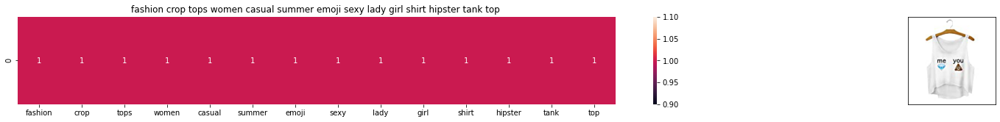

ASIN : B010V3B44G
Brand: Doxi Supermall
Title: fashion crop tops women casual summer emoji sexy lady girl shirt hipster tank top 
Euclidean similarity with the query image : 0.0


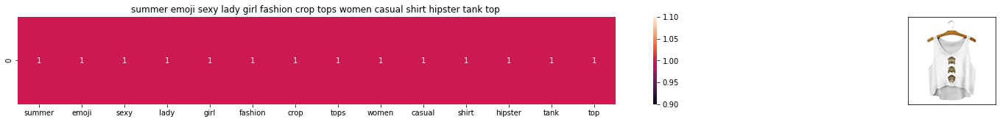

ASIN : B010V3BDII
Brand: Doxi Supermall
Title: summer emoji sexy lady girl fashion crop tops women casual shirt hipster tank top 
Euclidean similarity with the query image : 0.0


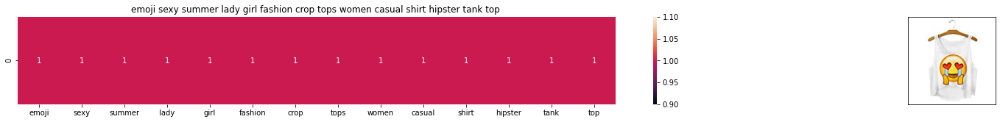

ASIN : B010V3BLWQ
Brand: Doxi Supermall
Title: emoji sexy summer lady girl fashion crop tops women casual shirt hipster tank top 
Euclidean similarity with the query image : 0.0


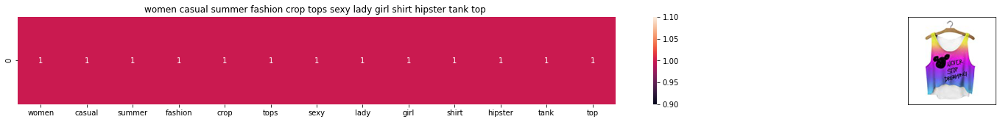

ASIN : B010V3AYSS
Brand: Doxi Supermall
Title: women casual summer fashion crop tops sexy lady girl shirt hipster tank top 
Euclidean similarity with the query image : 1.0


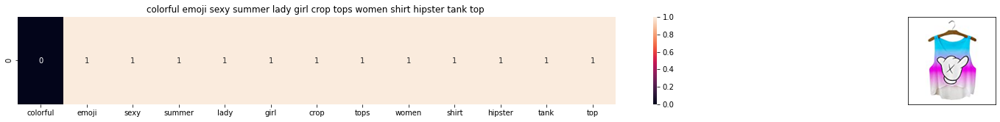

ASIN : B010V3BQZS
Brand: Doxi Supermall
Title: colorful emoji sexy summer lady girl crop tops women shirt hipster tank top 
Euclidean similarity with the query image : 1.7320508075688772


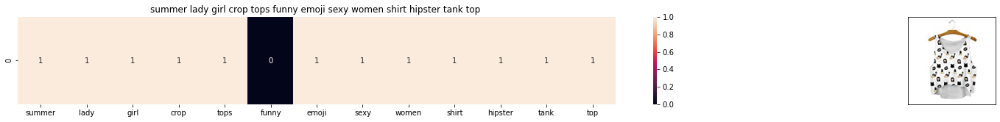

ASIN : B010V3BVMQ
Brand: Doxi Supermall
Title: summer lady girl crop tops funny emoji sexy women shirt hipster tank top 
Euclidean similarity with the query image : 1.7320508075688772


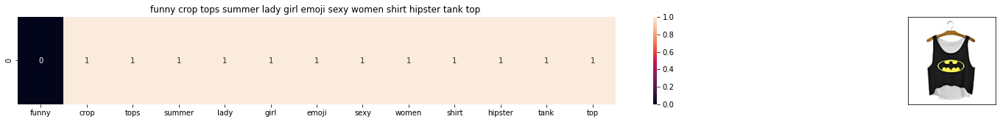

ASIN : B010V3C116
Brand: Doxi Supermall
Title: funny crop tops summer lady girl emoji sexy women shirt hipster tank top 
Euclidean similarity with the query image : 1.7320508075688772


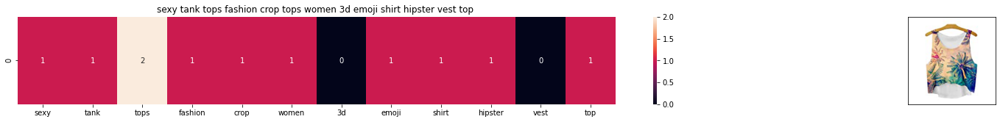

ASIN : B010V3DB9C
Brand: Doxi Supermall
Title: sexy tank tops fashion crop tops women 3d emoji shirt hipster vest top 
Euclidean similarity with the query image : 2.6457513110645907


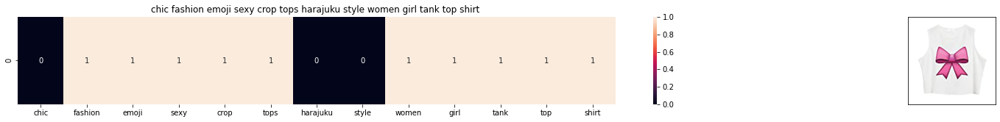

ASIN : B011RCJPR8
Brand: Chiclook Cool
Title: chic fashion emoji sexy crop tops harajuku style women girl tank top shirt 
Euclidean similarity with the query image : 2.6457513110645907


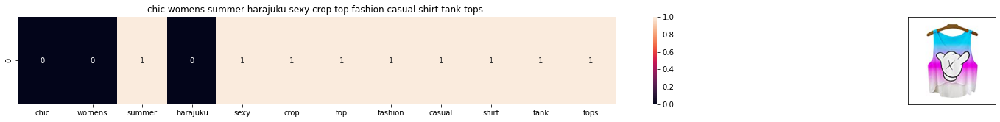

ASIN : B011RCJEMO
Brand: Chiclook Cool
Title: chic womens summer harajuku sexy crop top fashion casual shirt tank tops 
Euclidean similarity with the query image : 2.8284271247461903


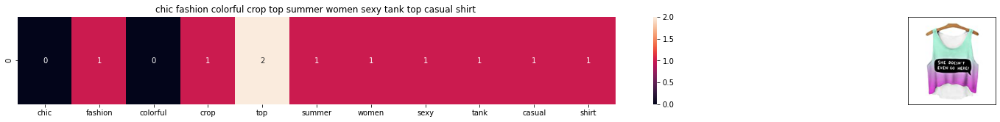

ASIN : B011RCJ6UE
Brand: Chiclook Cool
Title: chic fashion colorful crop top summer women sexy tank top casual shirt 
Euclidean similarity with the query image : 2.8284271247461903


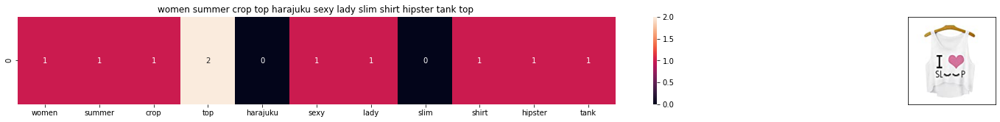

ASIN : B010V3EDEE
Brand: Doxi Supermall
Title: women summer crop top harajuku sexy lady slim shirt hipster tank top 
Euclidean similarity with the query image : 2.8284271247461903


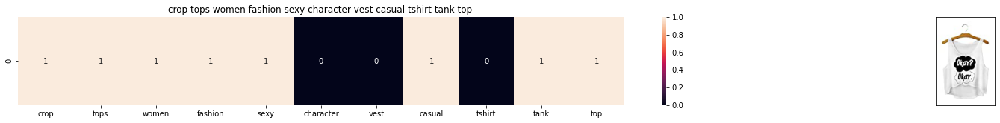

ASIN : B0107UEPVM
Brand: Mang GO
Title: crop tops women fashion sexy character vest casual tshirt tank top 
Euclidean similarity with the query image : 3.0


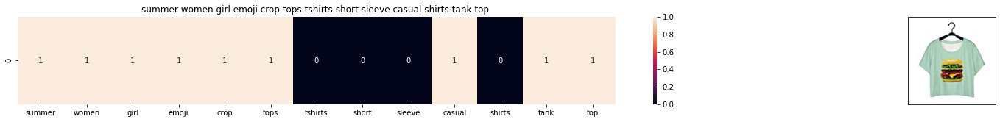

ASIN : B0124ECIU4
Brand: Doxi Supermall
Title: summer women girl emoji crop tops tshirts short sleeve casual shirts tank top 
Euclidean similarity with the query image : 3.0


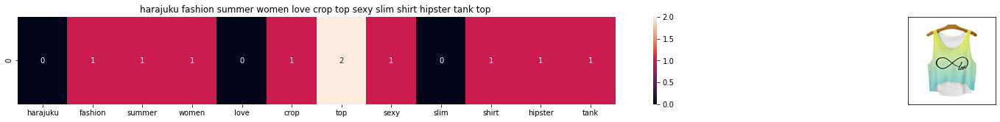

ASIN : B010V35OBU
Brand: Doxi Supermall
Title: harajuku fashion summer women love crop top sexy slim shirt hipster tank top 
Euclidean similarity with the query image : 3.0


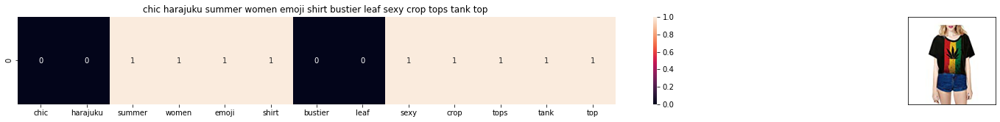

ASIN : B011UEXGH8
Brand: Chiclook Cool
Title: chic harajuku summer women emoji shirt bustier leaf sexy crop tops tank top 
Euclidean similarity with the query image : 3.0


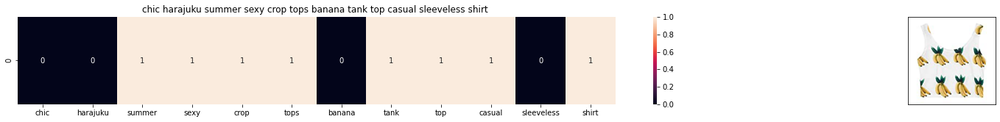

ASIN : B011RCIQBE
Brand: Chiclook Cool
Title: chic harajuku summer sexy crop tops banana tank top casual sleeveless shirt 
Euclidean similarity with the query image : 3.1622776601683795


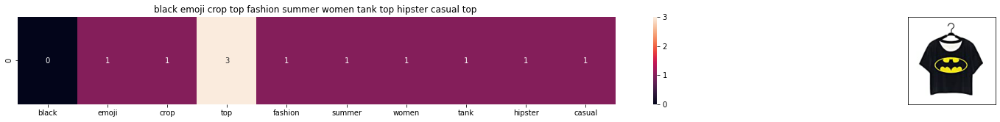

ASIN : B0124E80M4
Brand: Doxi Supermall
Title: black emoji crop top fashion summer women tank top hipster casual top 
Euclidean similarity with the query image : 3.1622776601683795


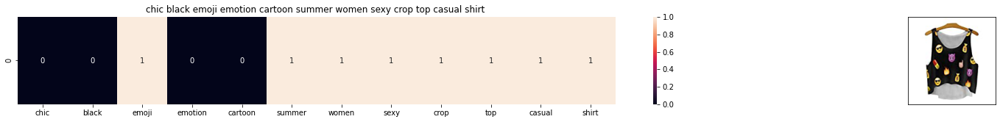

ASIN : B011RCJ4M4
Brand: Chiclook Cool
Title: chic black emoji emotion cartoon summer women sexy crop top casual shirt 
Euclidean similarity with the query image : 3.1622776601683795


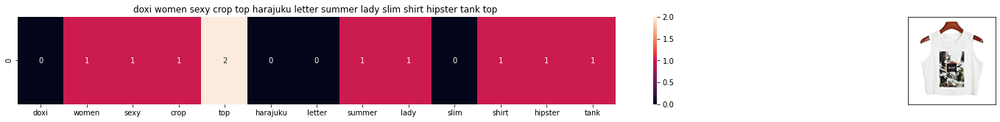

ASIN : B010V39146
Brand: Doxi Supermall
Title: doxi women sexy crop top harajuku letter summer lady slim shirt hipster tank top 
Euclidean similarity with the query image : 3.1622776601683795


In [49]:
def bag_of_words_model(doc_id, num_results):
        
    pairwise_dist = pairwise_distances(title_features,title_features[doc_id])
    
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    df_indices = list(data.index[indices])
    
    for i in range(0,len(indices)):
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'bag_of_words')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print ('Brand:', data['brand'].loc[df_indices[i]])
        print ('Title:', data['title'].loc[df_indices[i]])
        print ('Euclidean similarity with the query image :', pdists[i])
        print('='*60)

bag_of_words_model(12566, 20)

In [50]:
tfidf_title_vectorizer = TfidfVectorizer(min_df = 0)
tfidf_title_features = tfidf_title_vectorizer.fit_transform(data['title'])

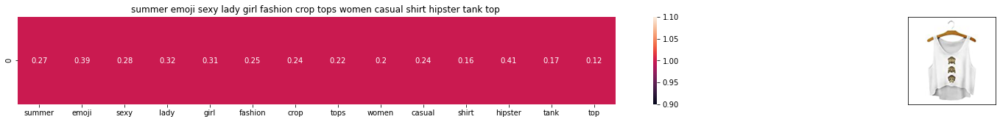

ASIN : B010V3BDII
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.0


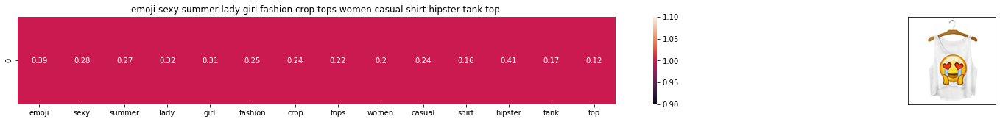

ASIN : B010V3BLWQ
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.0


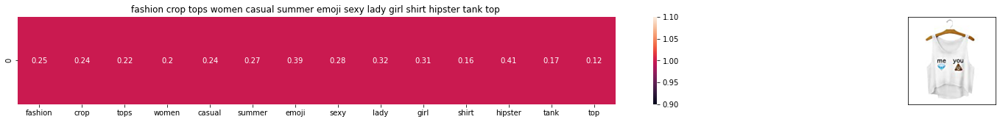

ASIN : B010V3B44G
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.0


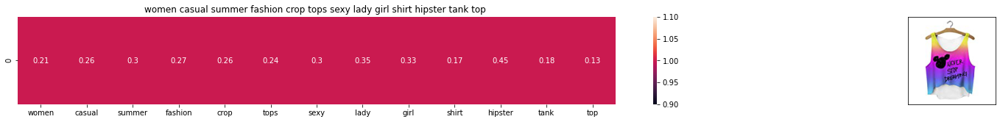

ASIN : B010V3AYSS
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.40138594750235


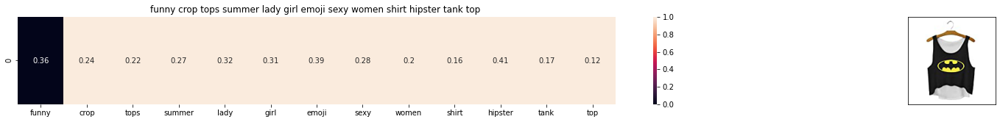

ASIN : B010V3C116
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.49544215538955555


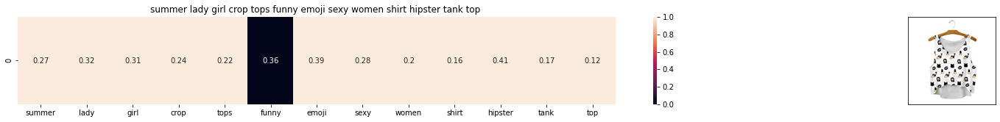

ASIN : B010V3BVMQ
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.49544215538955555


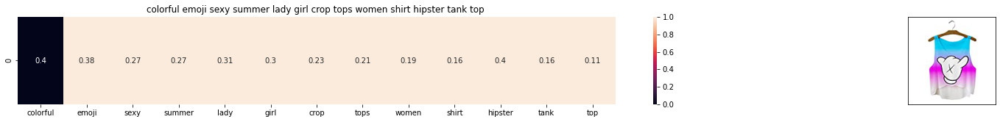

ASIN : B010V3BQZS
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.5241689140292634


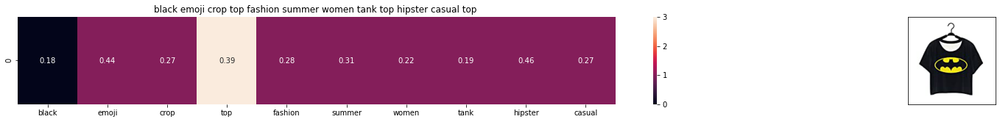

ASIN : B0124E80M4
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.684158162664275


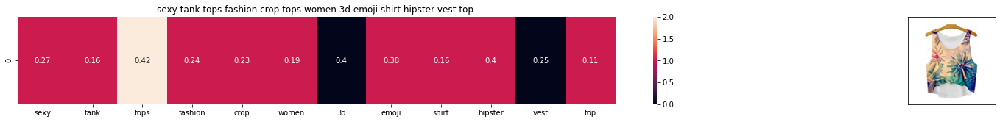

ASIN : B010V3DB9C
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.7731343455110792


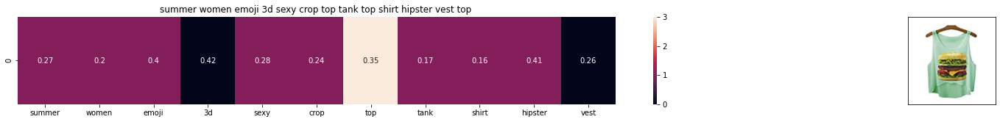

ASIN : B010V3E5EC
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.8128754313990525


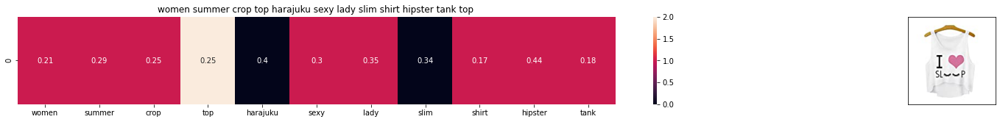

ASIN : B010V3EDEE
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.8437056912864757


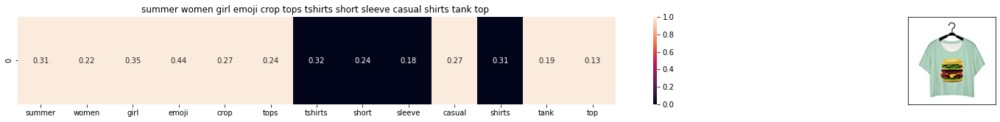

ASIN : B0124ECIU4
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.8553483954246192


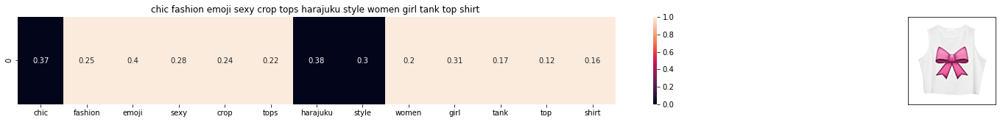

ASIN : B011RCJPR8
BRAND : Chiclook Cool
Eucliden distance from the given image : 0.8826321316686153


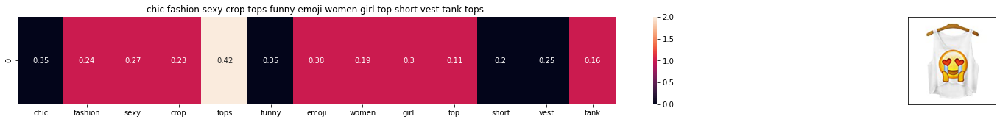

ASIN : B011RCJH58
BRAND : Chiclook Cool
Eucliden distance from the given image : 0.9004017468013861


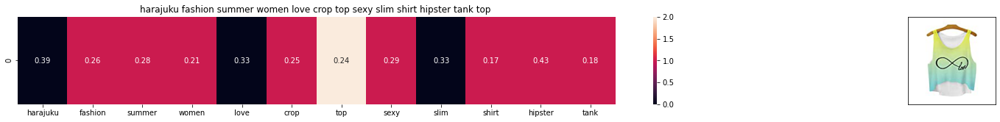

ASIN : B010V35OBU
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.9172816572673457


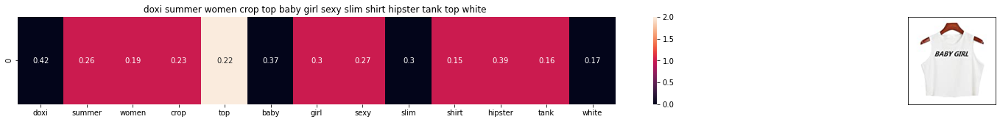

ASIN : B010V3A23U
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.9303848929561548


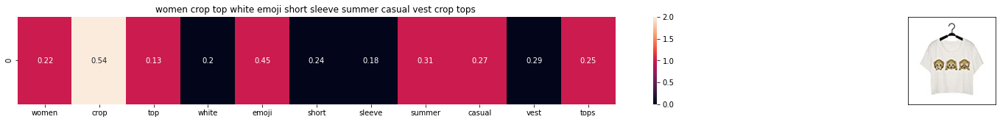

ASIN : B0124E7MHS
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.9334421080980745


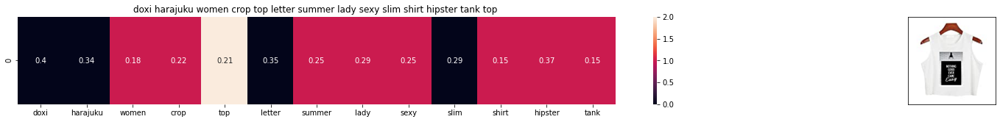

ASIN : B010V380LQ
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.9525344637195033


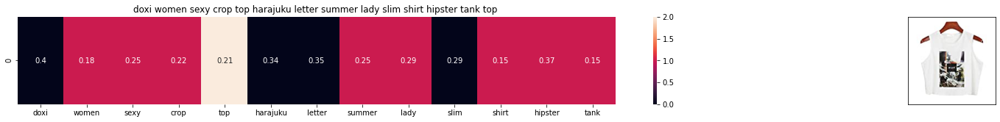

ASIN : B010V39146
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.9525344637195033


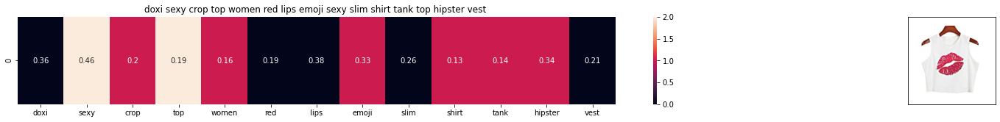

ASIN : B010TKXEHG
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.9560708174154957


In [51]:
def tfidf_model(doc_id, num_results):
    pairwise_dist = pairwise_distances(tfidf_title_features,tfidf_title_features[doc_id])
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]
    df_indices = list(data.index[indices])
    for i in range(0,len(indices)):
        get_result(indices[i], data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'tfidf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('Eucliden distance from the given image :', pdists[i])
        print('='*125)
tfidf_model(12566, 20)

In [52]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])

In [53]:
def n_containing(word):
    return sum(1 for blob in data['title'] if word in blob.split())
def idf(word):
    return math.log(data.shape[0] / (n_containing(word)))

In [54]:
import math

In [55]:
idf_title_features  = idf_title_features.astype(np.float)
for i in idf_title_vectorizer.vocabulary_.keys():
    idf_val = idf(i)
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val

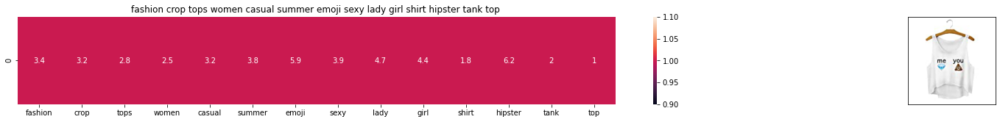

ASIN : B010V3B44G
Brand : Doxi Supermall
euclidean distance from the given image : 0.0


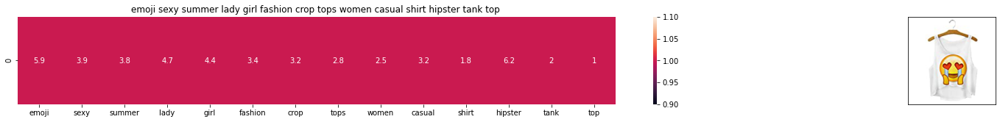

ASIN : B010V3BLWQ
Brand : Doxi Supermall
euclidean distance from the given image : 0.0


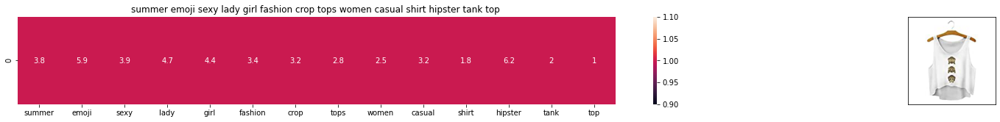

ASIN : B010V3BDII
Brand : Doxi Supermall
euclidean distance from the given image : 0.0


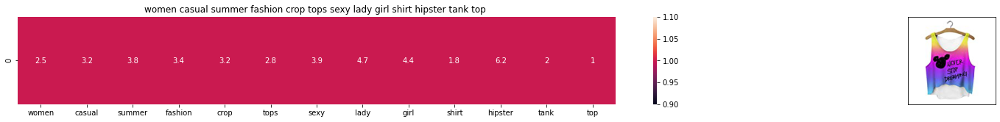

ASIN : B010V3AYSS
Brand : Doxi Supermall
euclidean distance from the given image : 5.922978852180059


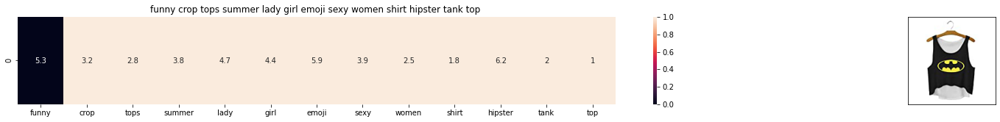

ASIN : B010V3C116
Brand : Doxi Supermall
euclidean distance from the given image : 7.037272185298332


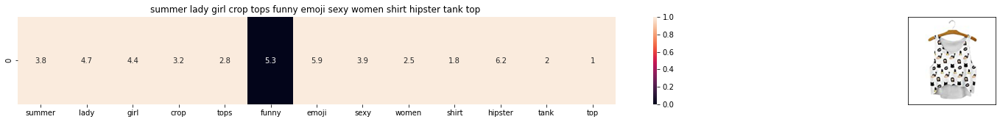

ASIN : B010V3BVMQ
Brand : Doxi Supermall
euclidean distance from the given image : 7.037272185298332


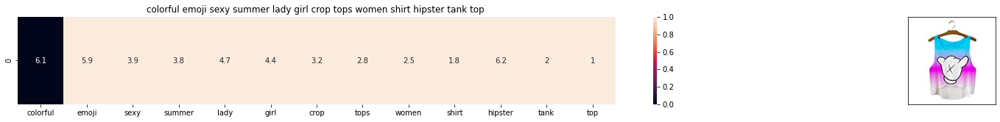

ASIN : B010V3BQZS
Brand : Doxi Supermall
euclidean distance from the given image : 7.667939547088641


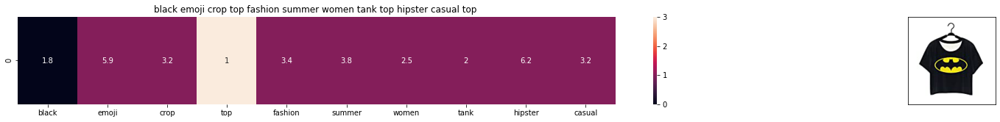

ASIN : B0124E80M4
Brand : Doxi Supermall
euclidean distance from the given image : 8.39863603811248


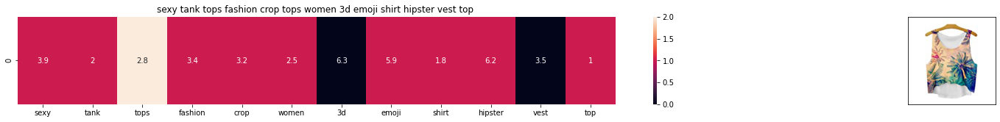

ASIN : B010V3DB9C
Brand : Doxi Supermall
euclidean distance from the given image : 10.835090137343855


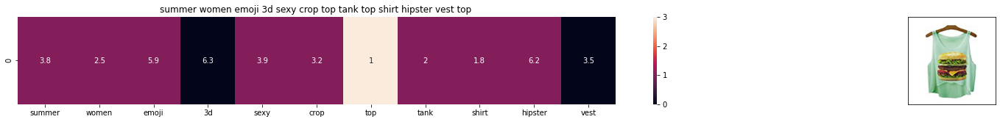

ASIN : B010V3E5EC
Brand : Doxi Supermall
euclidean distance from the given image : 11.060530175472811


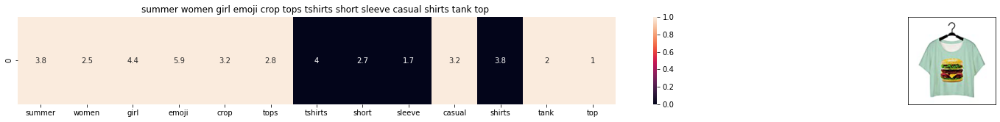

ASIN : B0124ECIU4
Brand : Doxi Supermall
euclidean distance from the given image : 11.456017724459604


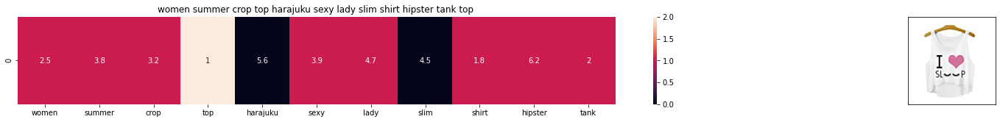

ASIN : B010V3EDEE
Brand : Doxi Supermall
euclidean distance from the given image : 11.635265990125815


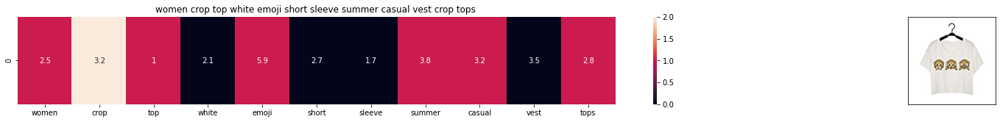

ASIN : B0124E7MHS
Brand : Doxi Supermall
euclidean distance from the given image : 11.844834283822053


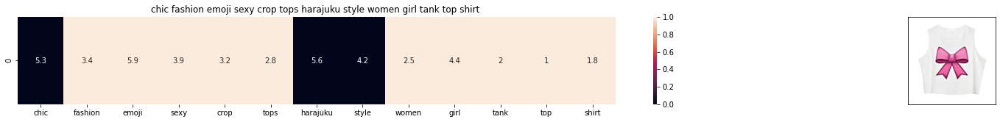

ASIN : B011RCJPR8
Brand : Chiclook Cool
euclidean distance from the given image : 12.760692810178545


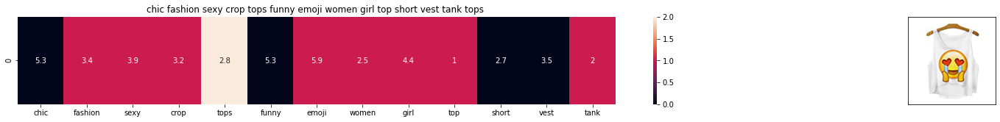

ASIN : B011RCJH58
Brand : Chiclook Cool
euclidean distance from the given image : 12.829128504563066


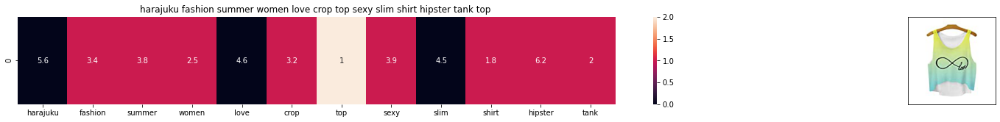

ASIN : B010V35OBU
Brand : Doxi Supermall
euclidean distance from the given image : 12.92180694297083


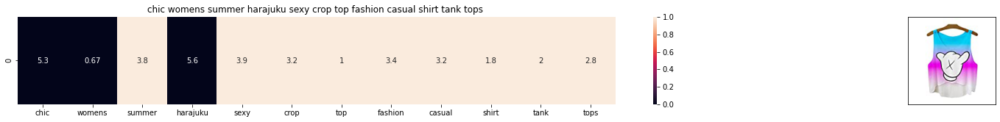

ASIN : B011RCJEMO
Brand : Chiclook Cool
euclidean distance from the given image : 13.474555736106787


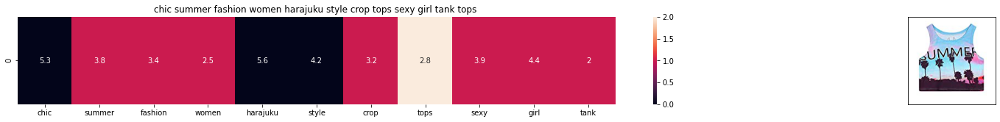

ASIN : B011OU51US
Brand : Chiclook Cool
euclidean distance from the given image : 13.713807644827545


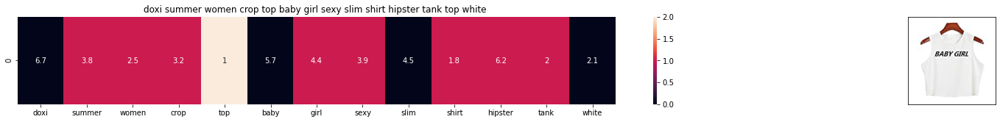

ASIN : B010V3A23U
Brand : Doxi Supermall
euclidean distance from the given image : 13.725325741546714


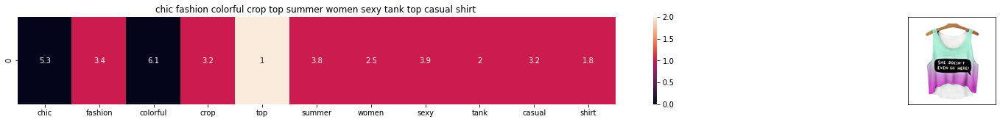

ASIN : B011RCJ6UE
Brand : Chiclook Cool
euclidean distance from the given image : 13.746787336587824


In [56]:
def idf_model(doc_id, num_results):
    pairwise_dist = pairwise_distances(idf_title_features,idf_title_features[doc_id])
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]
    df_indices = list(data.index[indices])
    for i in range(0,len(indices)):
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'idf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from the given image :', pdists[i])
        print('='*125)
idf_model(12566,20)    

In [57]:
import os

In [58]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle
with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)

In [59]:
def get_word_vec(sentence, doc_id, m_name):
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            vec.append(np.zeros(shape=(300,)))
    return  np.array(vec)
def get_distance(vec1, vec2):
    final_dist = []
    for i in vec1:
        dist = []
        for j in vec2:
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    return np.array(final_dist)
def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    s2_vec = get_word_vec(sentence2, doc_id2, model)
    s1_s2_dist = get_distance(s1_vec, s2_vec)
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    ax = plt.subplot(gs[0])
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    ax.set_xticklabels(sentence2.split())
    ax.set_yticklabels(sentence1.split())
    ax.set_title(sentence2)
    ax = plt.subplot(gs[1])
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [60]:
vocab = model.keys()
def build_avg_vec(sentence, num_features, doc_id, m_name):

    featureVec = np.zeros((num_features,), dtype="float32")
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    return featureVec

In [66]:
doc_id = 0
w2v_title = []
for i in data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1
 
w2v_title = np.array(w2v_title)


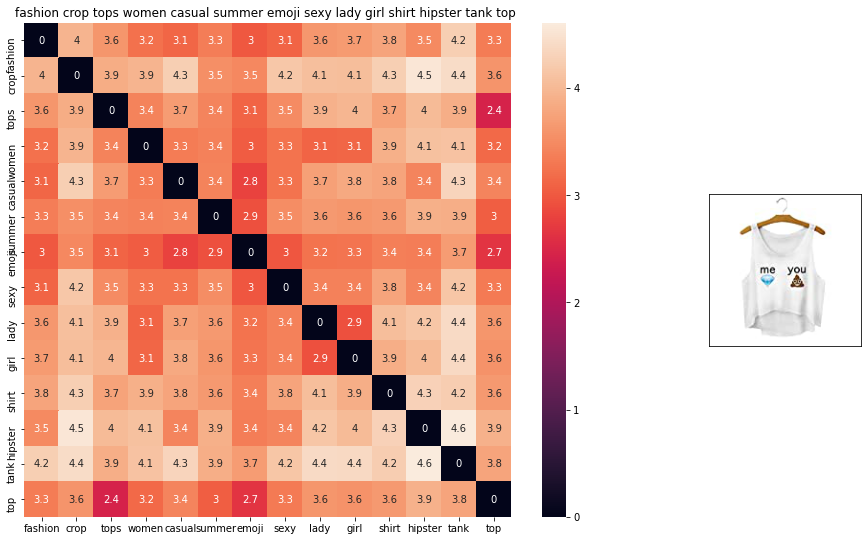

ASIN : B010V3B44G
BRAND : Doxi Supermall
euclidean distance from given input image : 3.6500243e-08


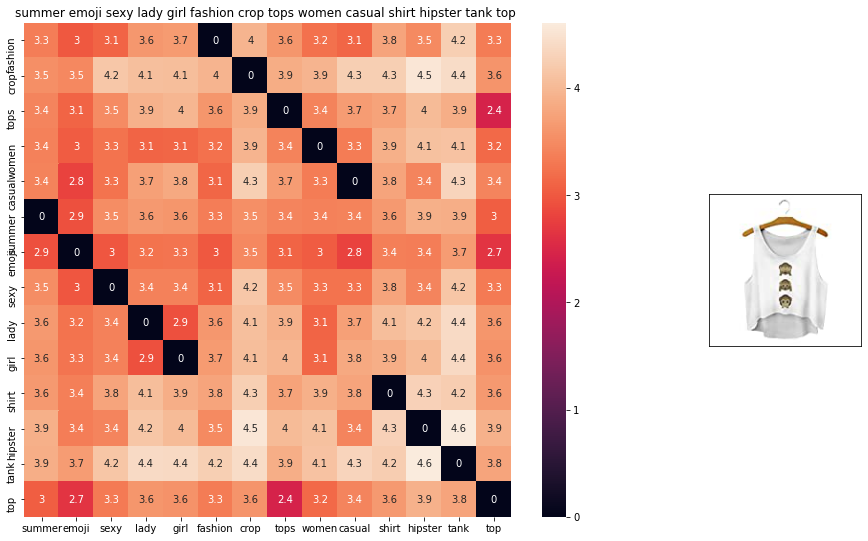

ASIN : B010V3BDII
BRAND : Doxi Supermall
euclidean distance from given input image : 3.6500243e-08


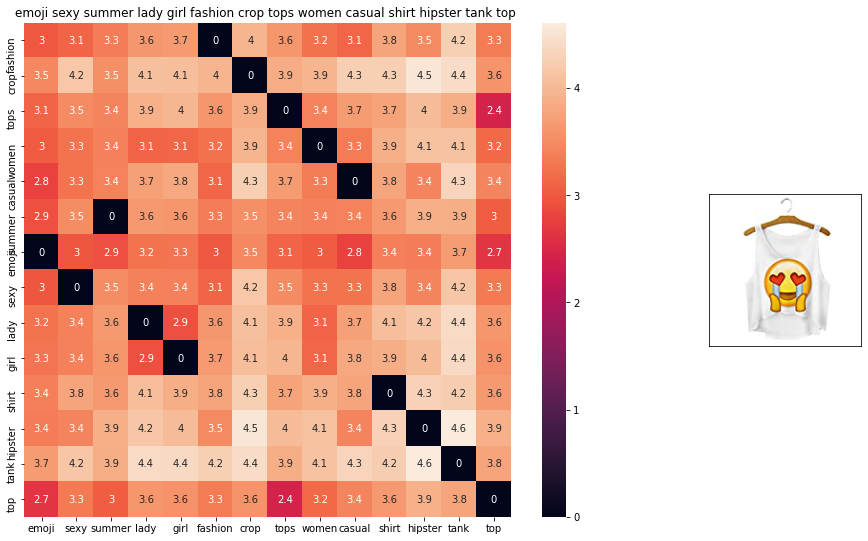

ASIN : B010V3BLWQ
BRAND : Doxi Supermall
euclidean distance from given input image : 3.6500243e-08


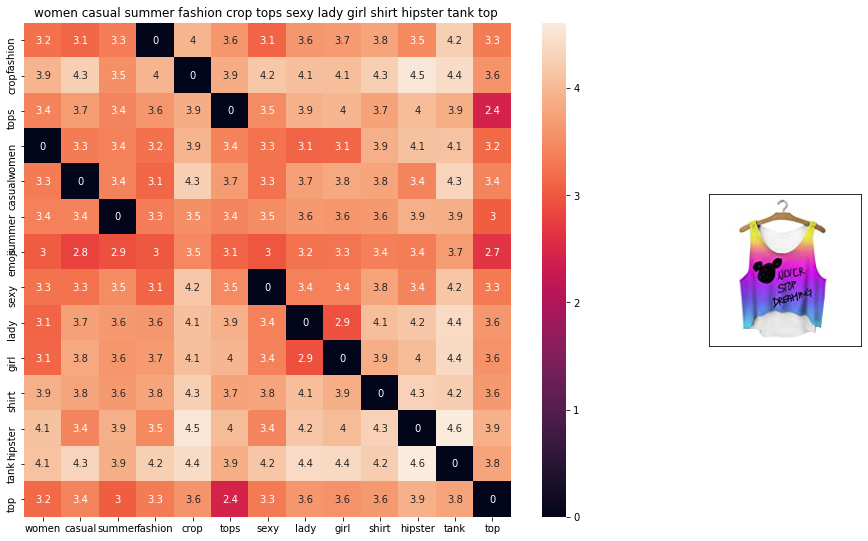

ASIN : B010V3AYSS
BRAND : Doxi Supermall
euclidean distance from given input image : 0.13368244


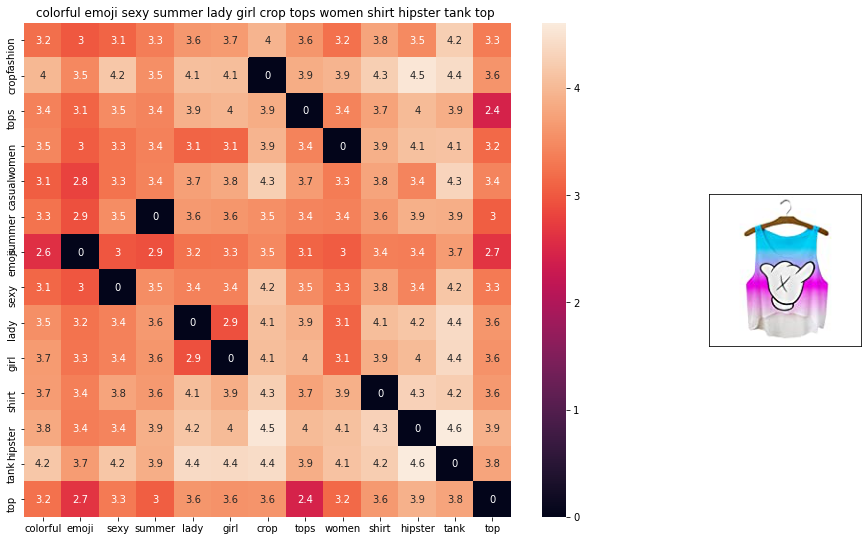

ASIN : B010V3BQZS
BRAND : Doxi Supermall
euclidean distance from given input image : 0.29837728


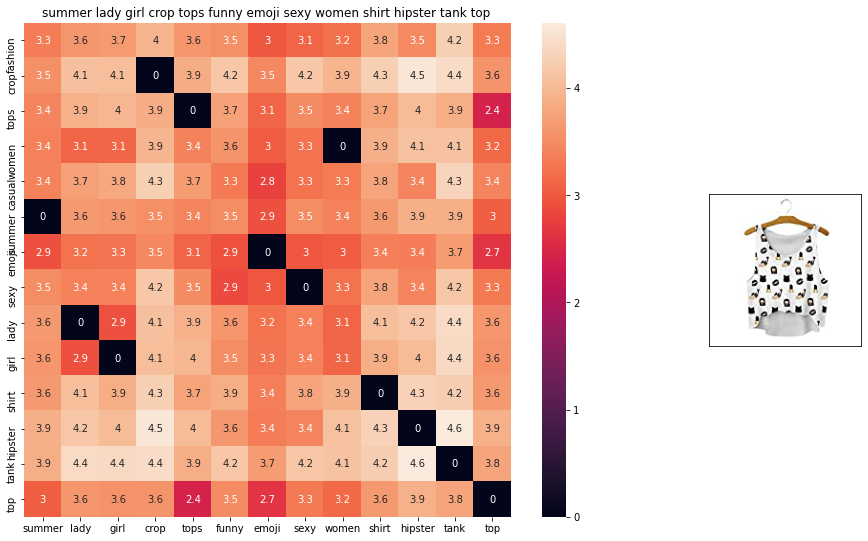

ASIN : B010V3BVMQ
BRAND : Doxi Supermall
euclidean distance from given input image : 0.3274634


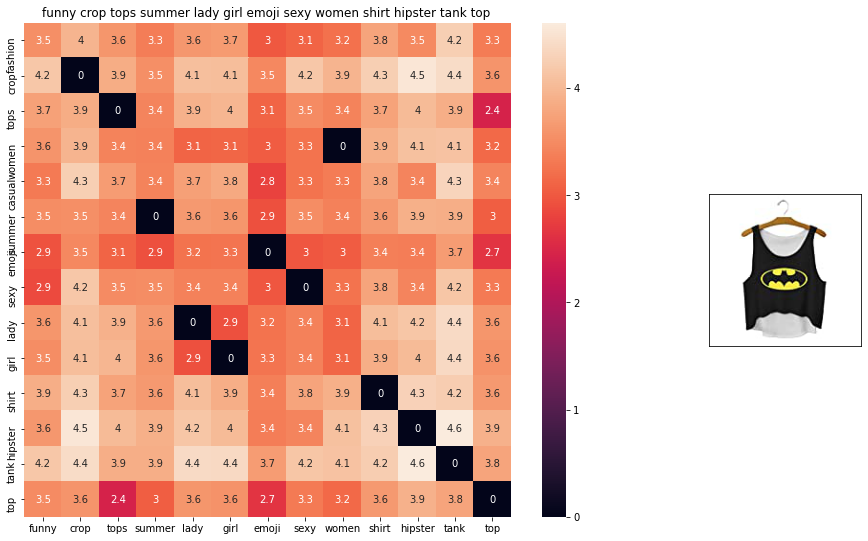

ASIN : B010V3C116
BRAND : Doxi Supermall
euclidean distance from given input image : 0.3274634


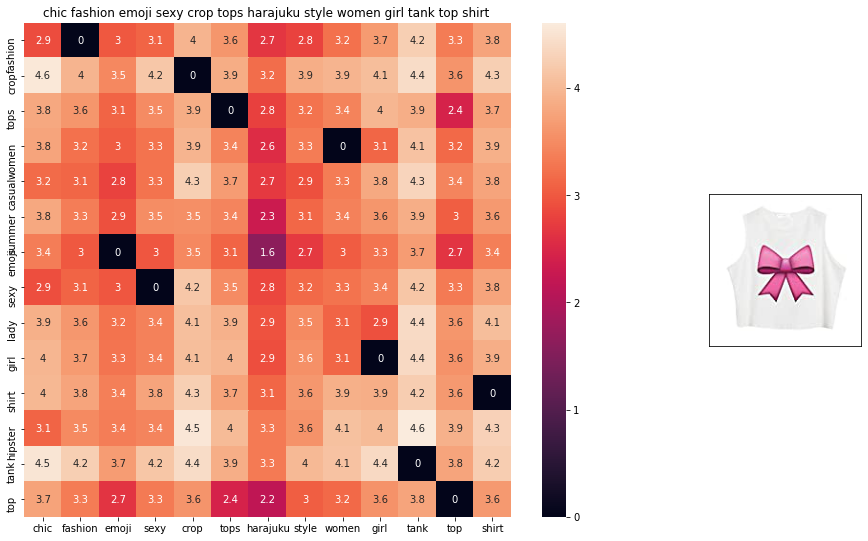

ASIN : B011RCJPR8
BRAND : Chiclook Cool
euclidean distance from given input image : 0.40975842


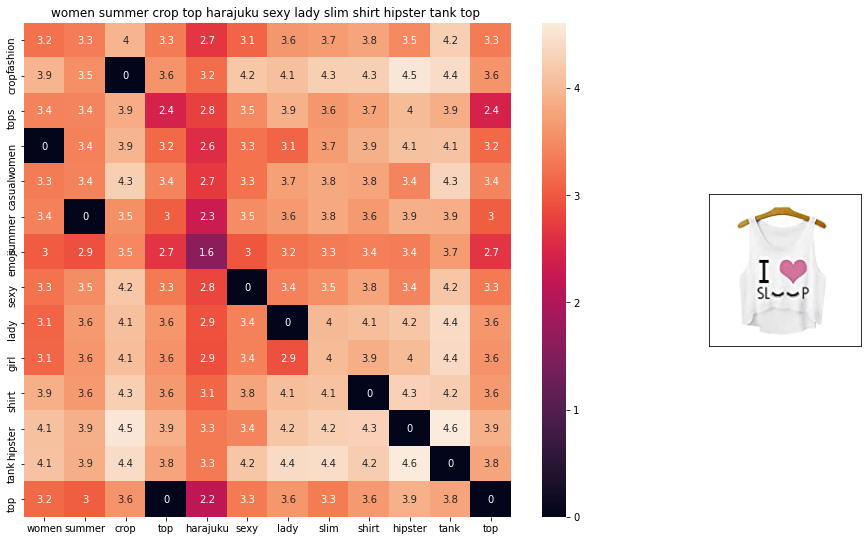

ASIN : B010V3EDEE
BRAND : Doxi Supermall
euclidean distance from given input image : 0.46806592


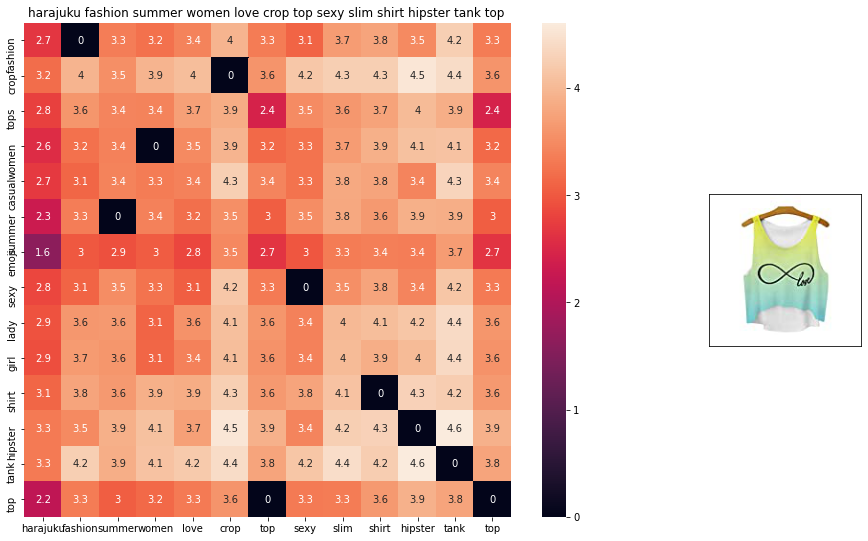

ASIN : B010V35OBU
BRAND : Doxi Supermall
euclidean distance from given input image : 0.4957314


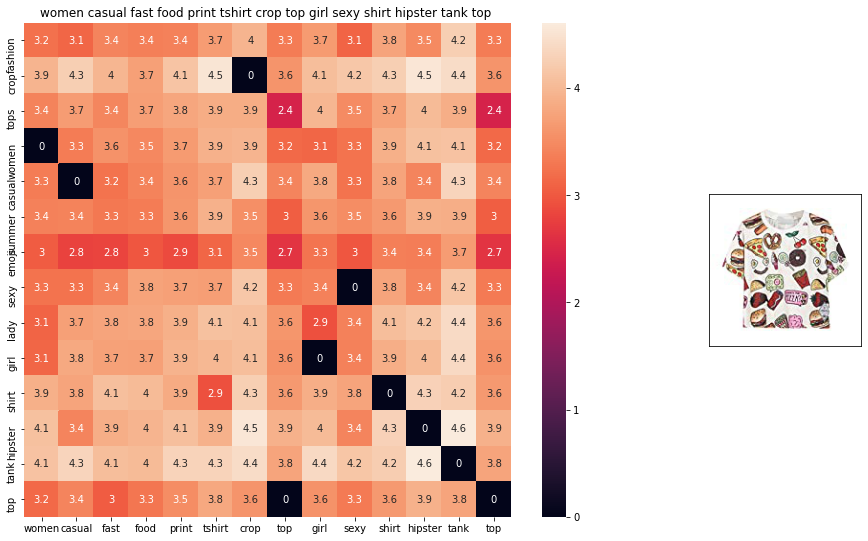

ASIN : B010V3AB5O
BRAND : Doxi Supermall
euclidean distance from given input image : 0.50107545


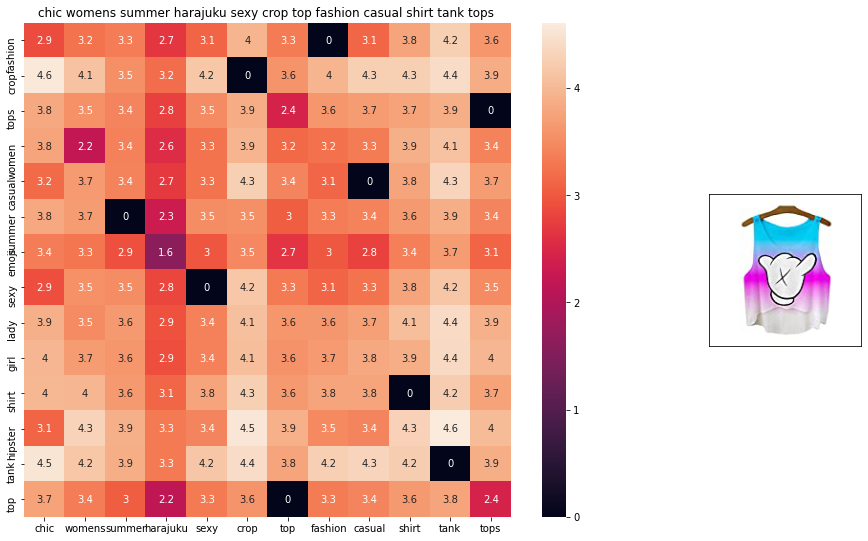

ASIN : B011RCJEMO
BRAND : Chiclook Cool
euclidean distance from given input image : 0.5027281


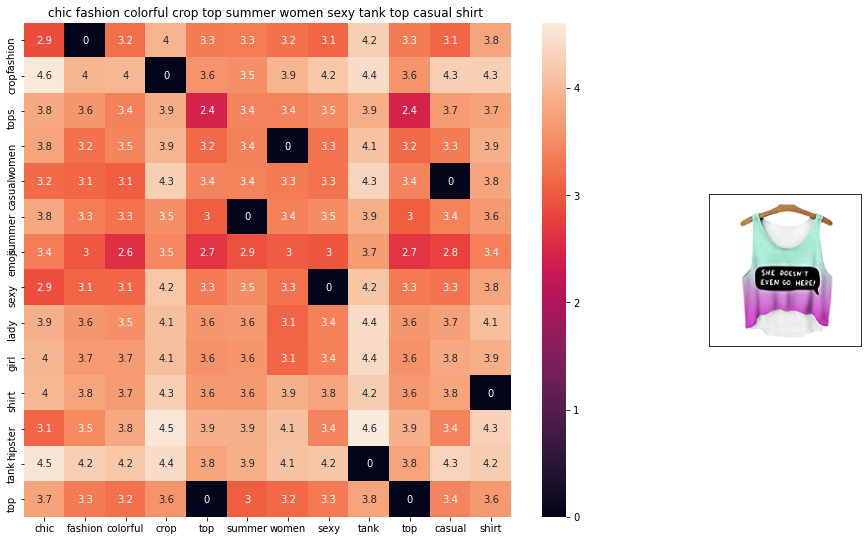

ASIN : B011RCJ6UE
BRAND : Chiclook Cool
euclidean distance from given input image : 0.5073639


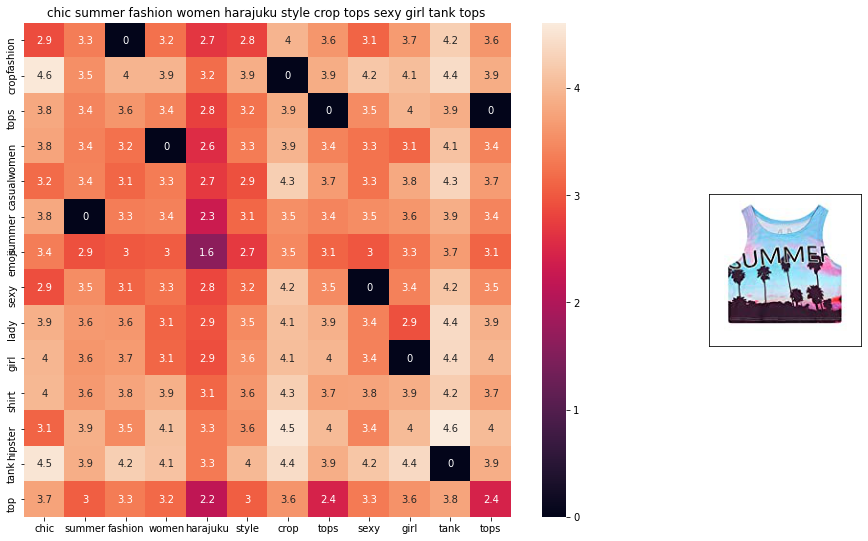

ASIN : B011OU51US
BRAND : Chiclook Cool
euclidean distance from given input image : 0.5160891


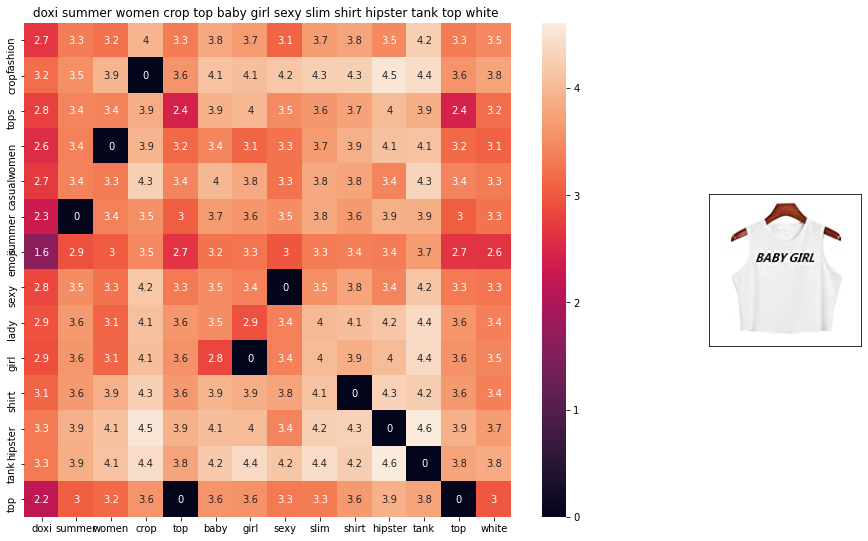

ASIN : B010V3A23U
BRAND : Doxi Supermall
euclidean distance from given input image : 0.5262789


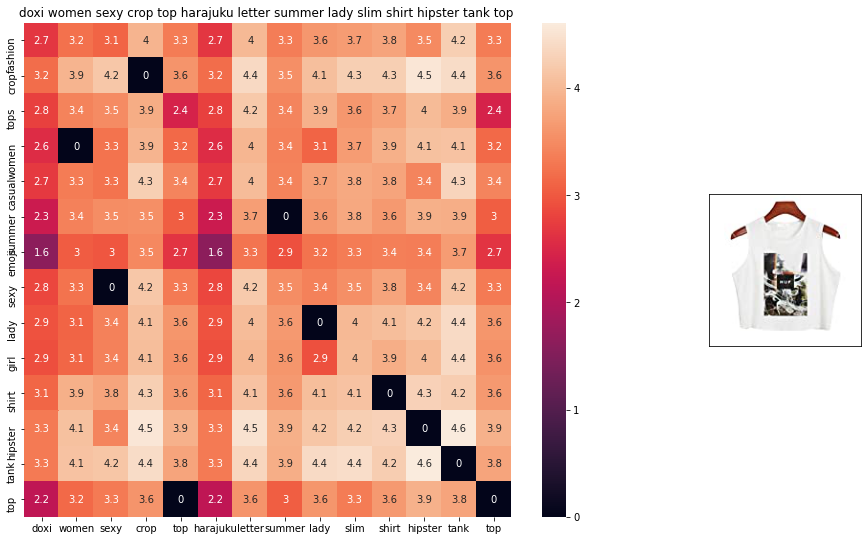

ASIN : B010V39146
BRAND : Doxi Supermall
euclidean distance from given input image : 0.5270717


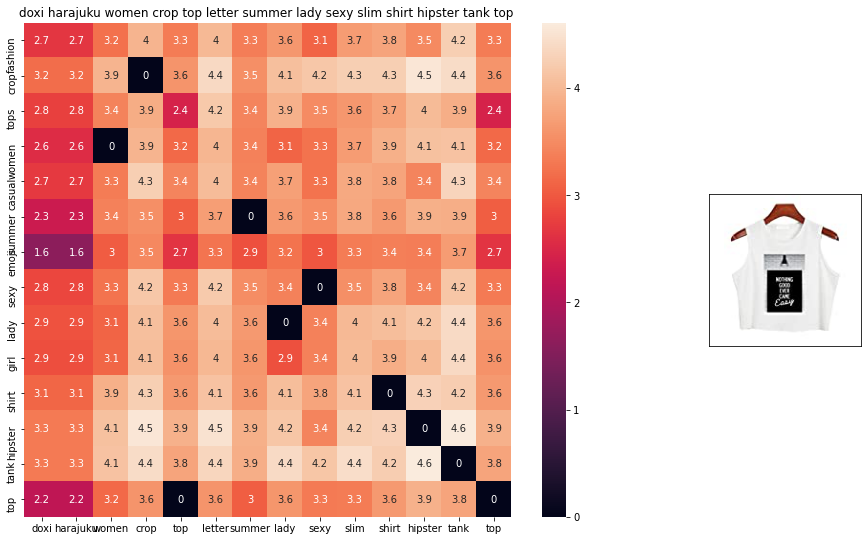

ASIN : B010V380LQ
BRAND : Doxi Supermall
euclidean distance from given input image : 0.5270717


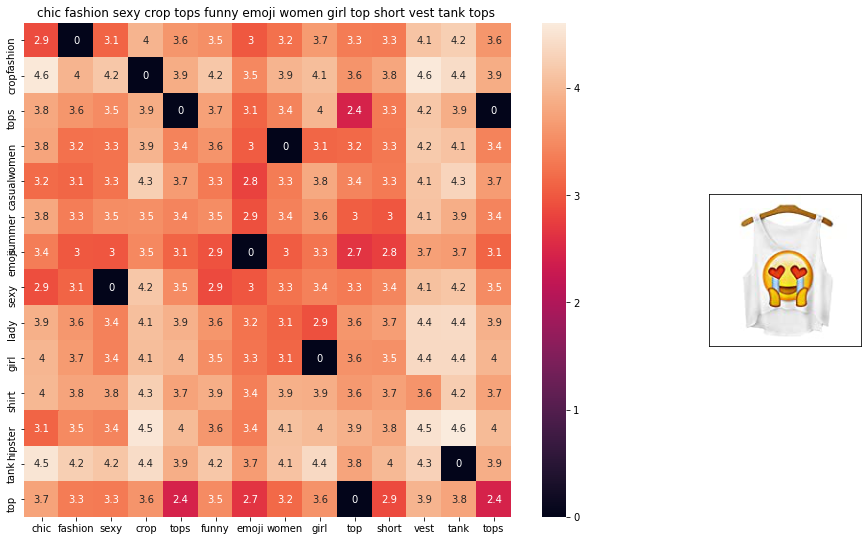

ASIN : B011RCJH58
BRAND : Chiclook Cool
euclidean distance from given input image : 0.52816993


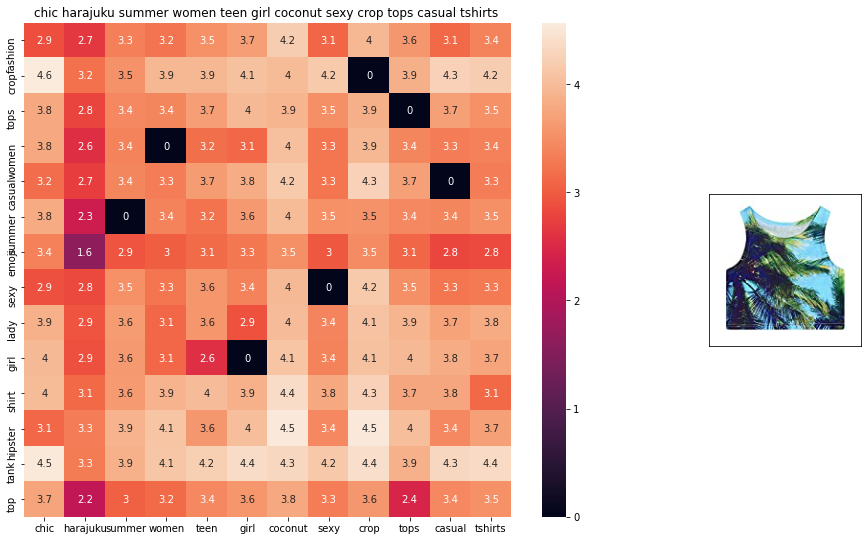

ASIN : B011OU4R08
BRAND : Chiclook Cool
euclidean distance from given input image : 0.5545634


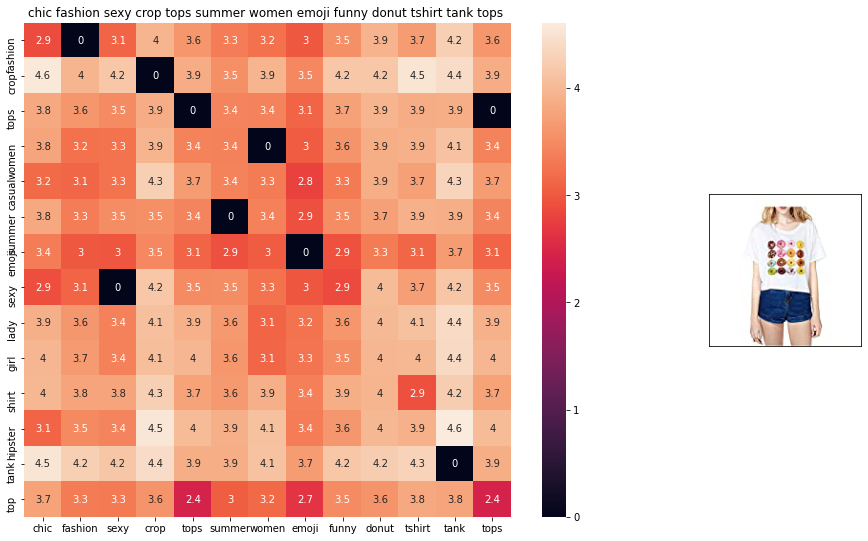

ASIN : B011UEUTQE
BRAND : Chiclook Cool
euclidean distance from given input image : 0.57349175


In [67]:
def avg_w2v_model(doc_id, num_results):
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from given input image :', pdists[i])
        print('='*125)

        
avg_w2v_model(12566, 20)

In [68]:
doc_id = 0
w2v_title_weight = []
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1 
w2v_title_weight = np.array(w2v_title_weight)

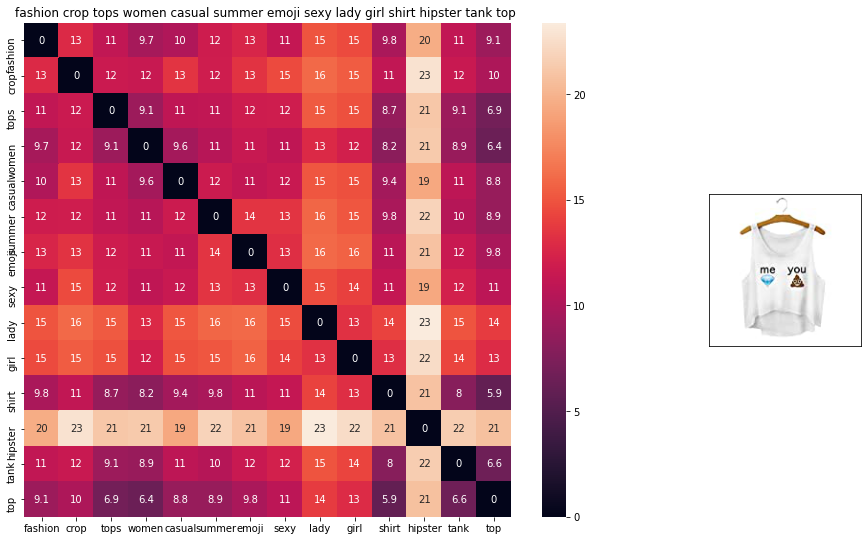

ASIN : B010V3B44G
Brand : Doxi Supermall
euclidean distance from input : 0.0


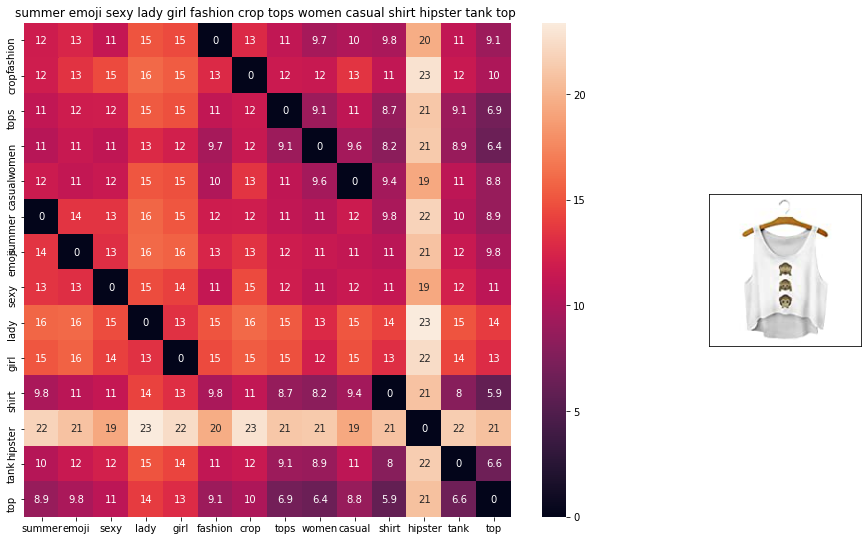

ASIN : B010V3BDII
Brand : Doxi Supermall
euclidean distance from input : 2.731428e-07


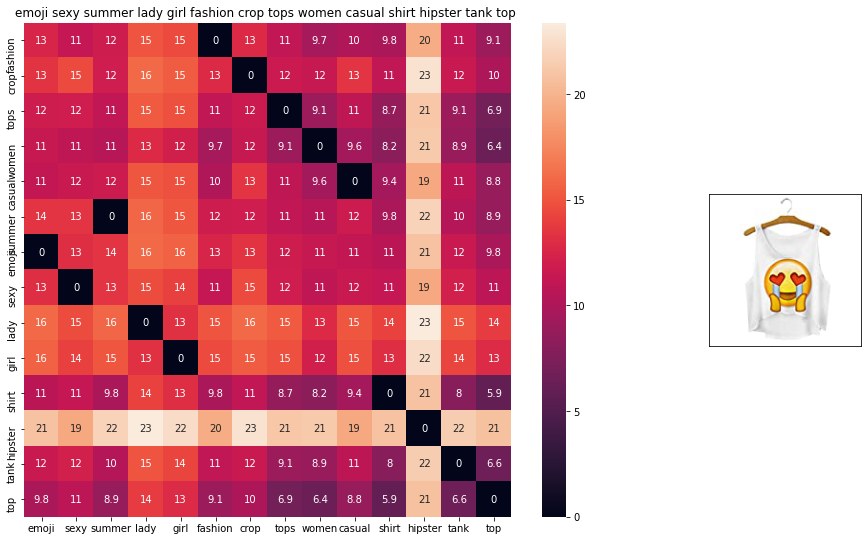

ASIN : B010V3BLWQ
Brand : Doxi Supermall
euclidean distance from input : 2.7957057e-07


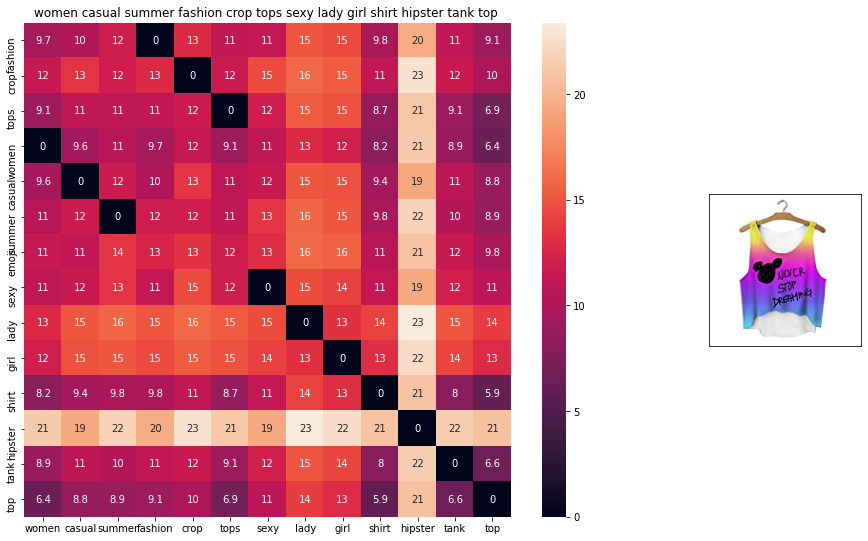

ASIN : B010V3AYSS
Brand : Doxi Supermall
euclidean distance from input : 0.6962319


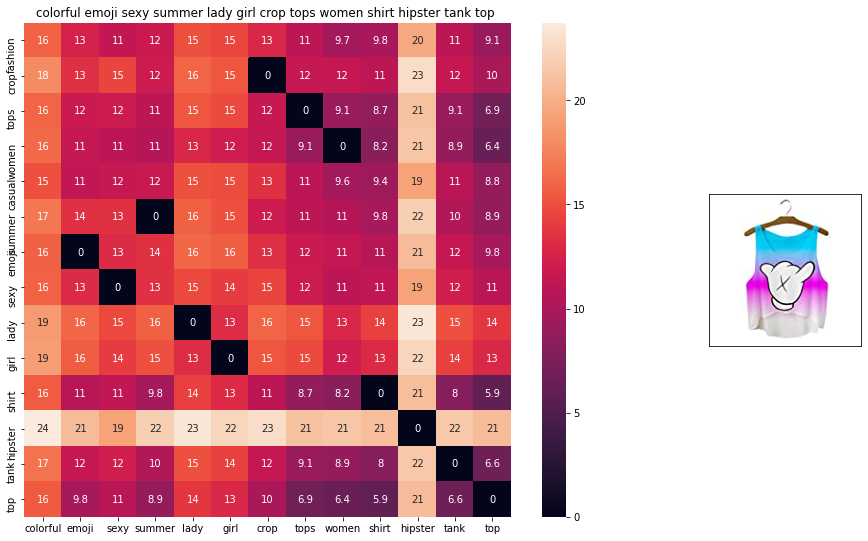

ASIN : B010V3BQZS
Brand : Doxi Supermall
euclidean distance from input : 1.2872719


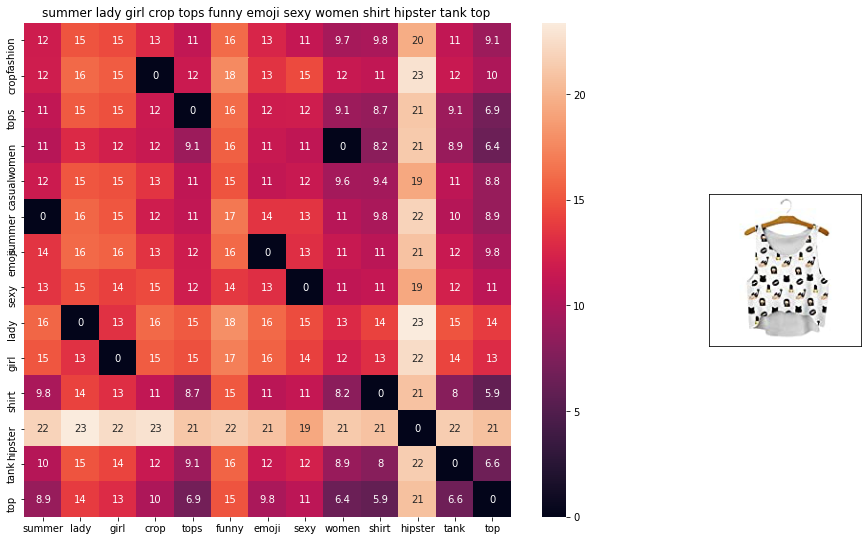

ASIN : B010V3BVMQ
Brand : Doxi Supermall
euclidean distance from input : 1.3530473


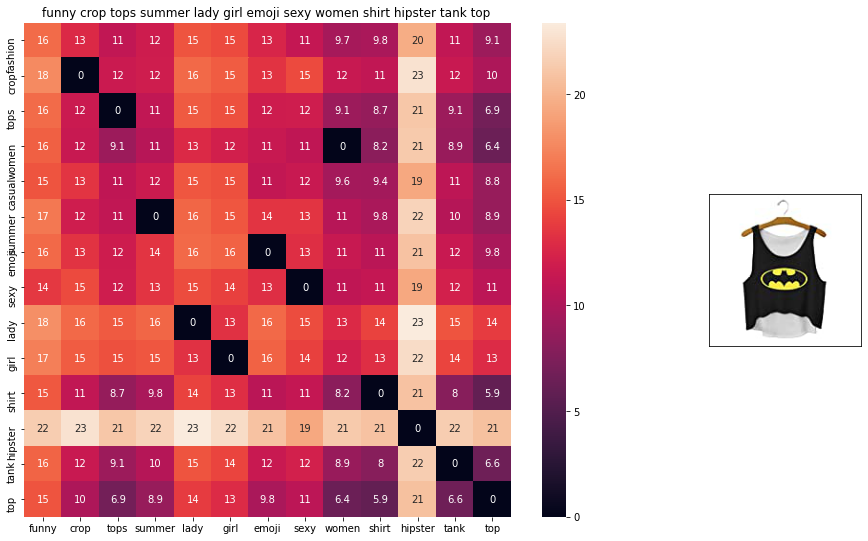

ASIN : B010V3C116
Brand : Doxi Supermall
euclidean distance from input : 1.3530474


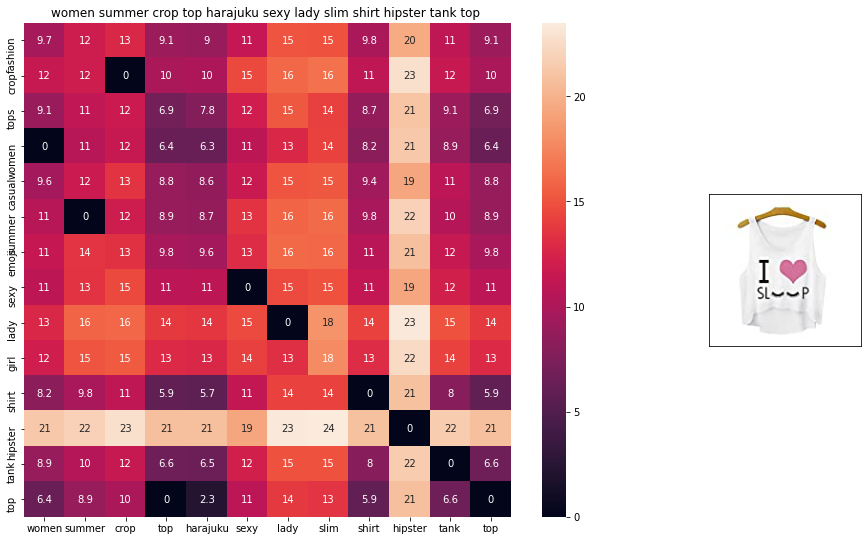

ASIN : B010V3EDEE
Brand : Doxi Supermall
euclidean distance from input : 1.7434151


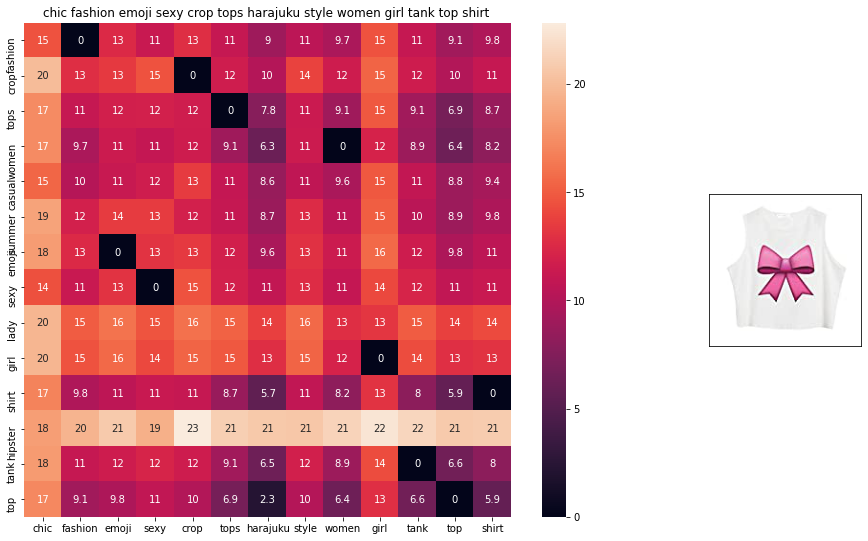

ASIN : B011RCJPR8
Brand : Chiclook Cool
euclidean distance from input : 1.934526


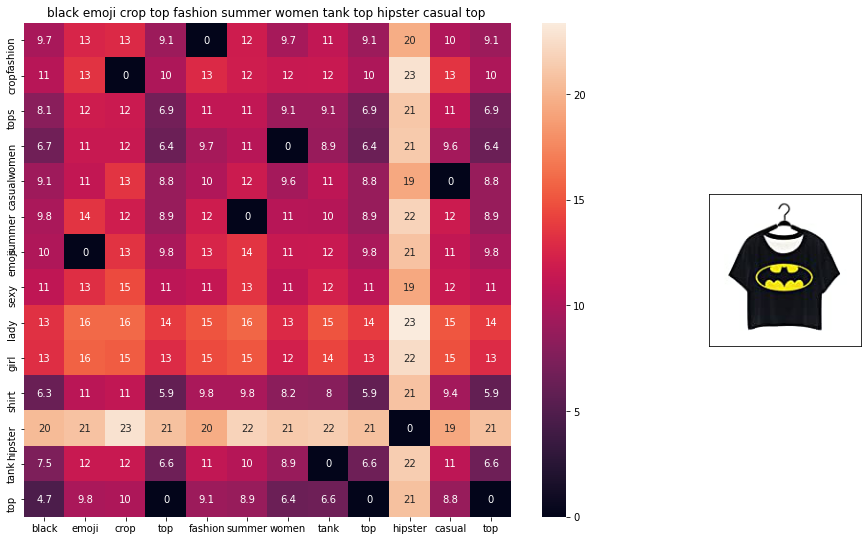

ASIN : B0124E80M4
Brand : Doxi Supermall
euclidean distance from input : 2.032144


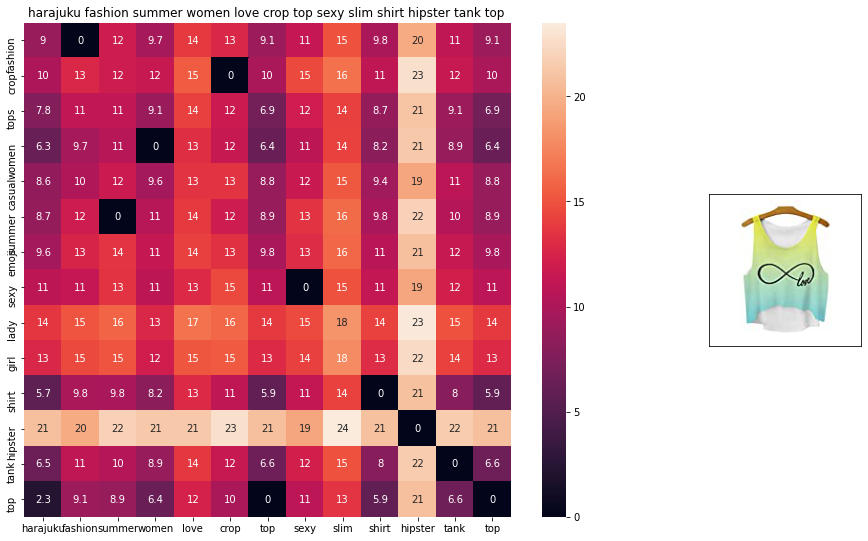

ASIN : B010V35OBU
Brand : Doxi Supermall
euclidean distance from input : 2.0631945


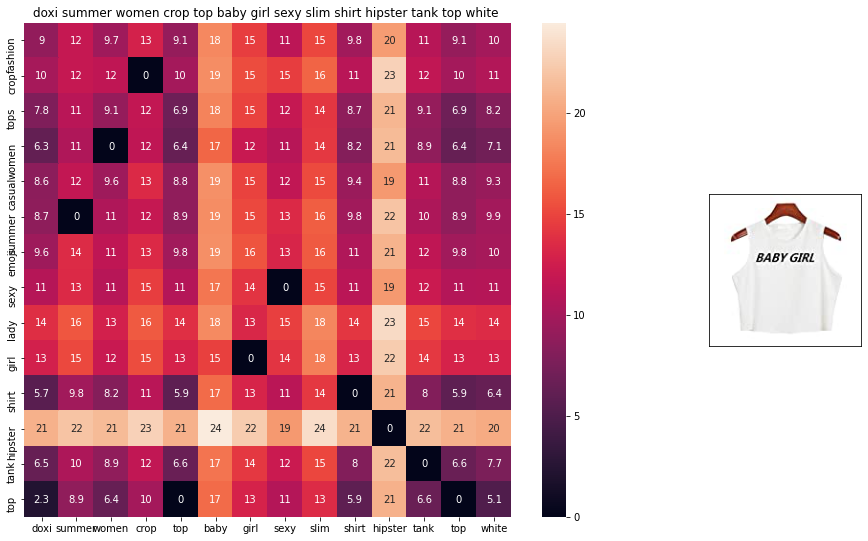

ASIN : B010V3A23U
Brand : Doxi Supermall
euclidean distance from input : 2.1243675


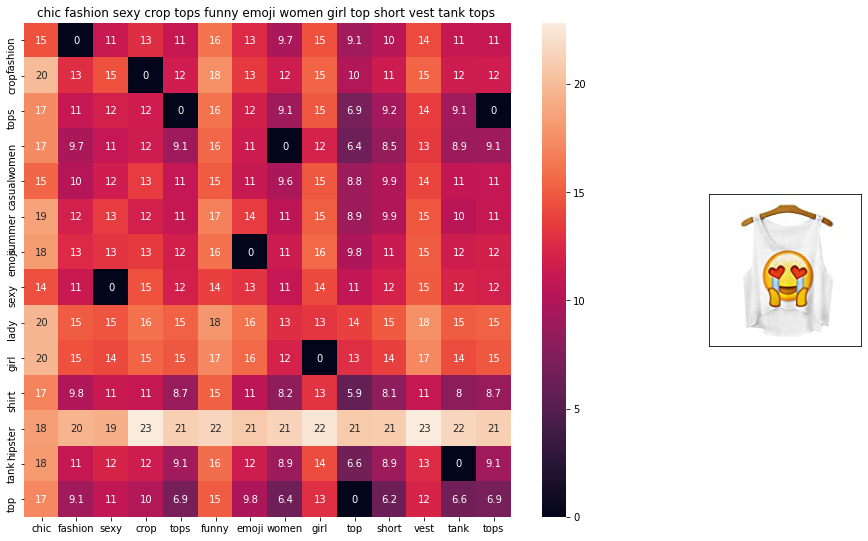

ASIN : B011RCJH58
Brand : Chiclook Cool
euclidean distance from input : 2.1507077


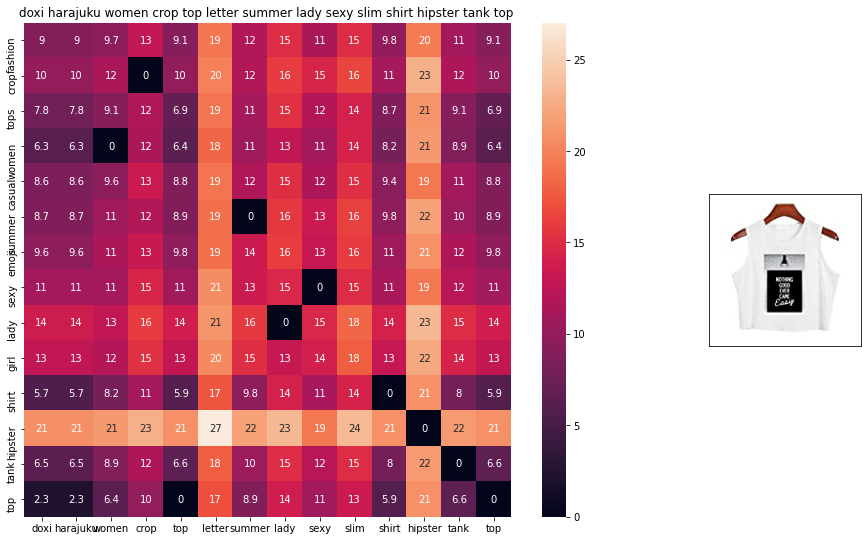

ASIN : B010V380LQ
Brand : Doxi Supermall
euclidean distance from input : 2.1674914


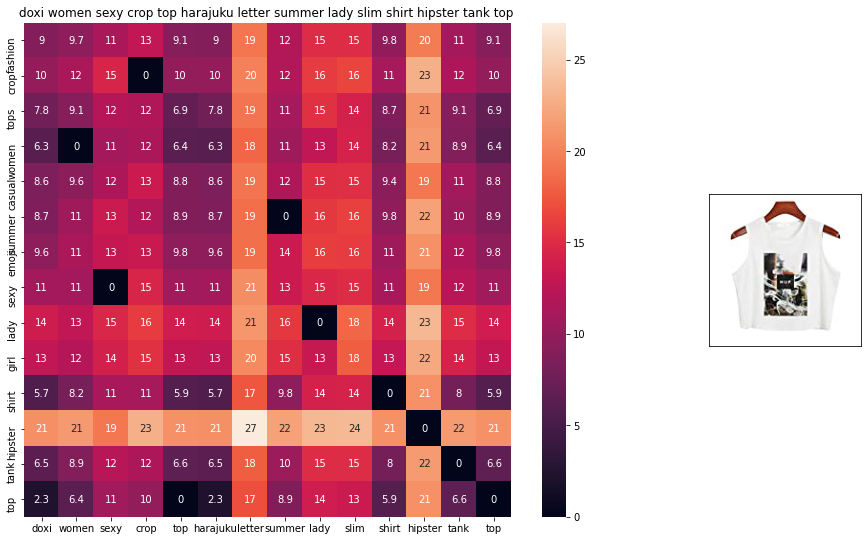

ASIN : B010V39146
Brand : Doxi Supermall
euclidean distance from input : 2.1674914


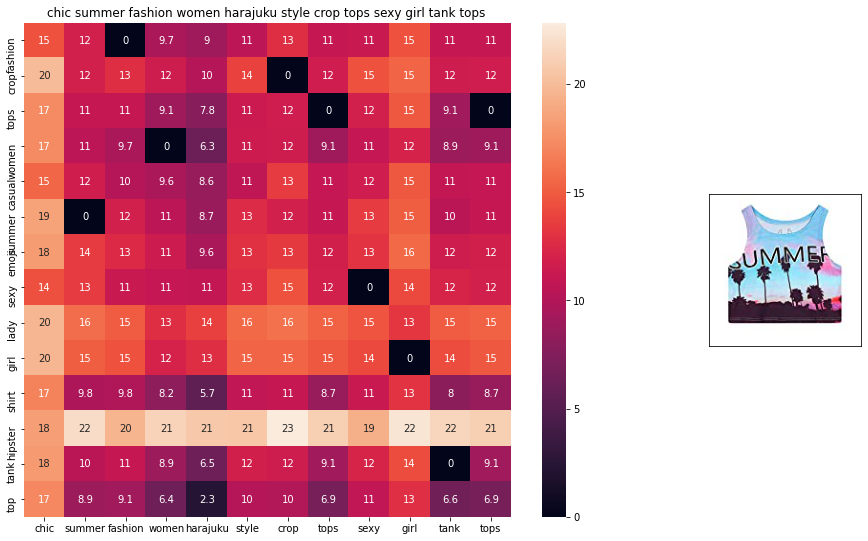

ASIN : B011OU51US
Brand : Chiclook Cool
euclidean distance from input : 2.2320173


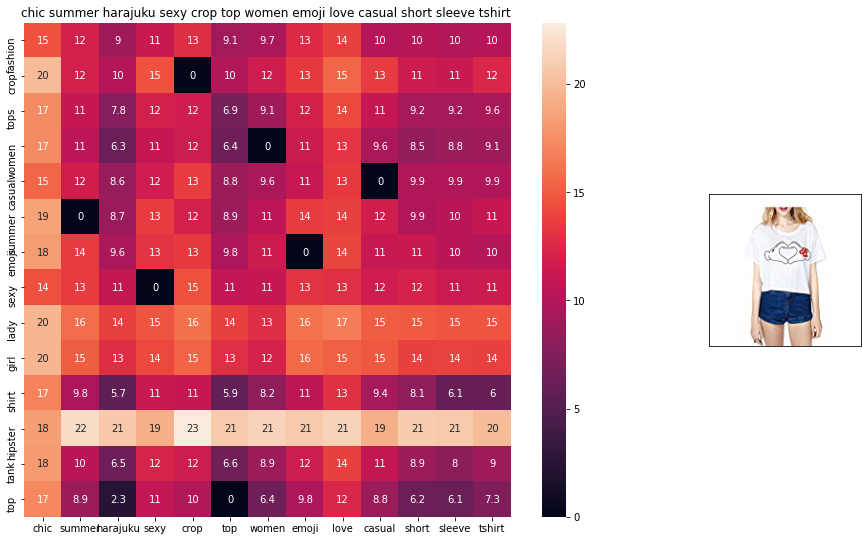

ASIN : B011UEVF4O
Brand : Chiclook Cool
euclidean distance from input : 2.3134534


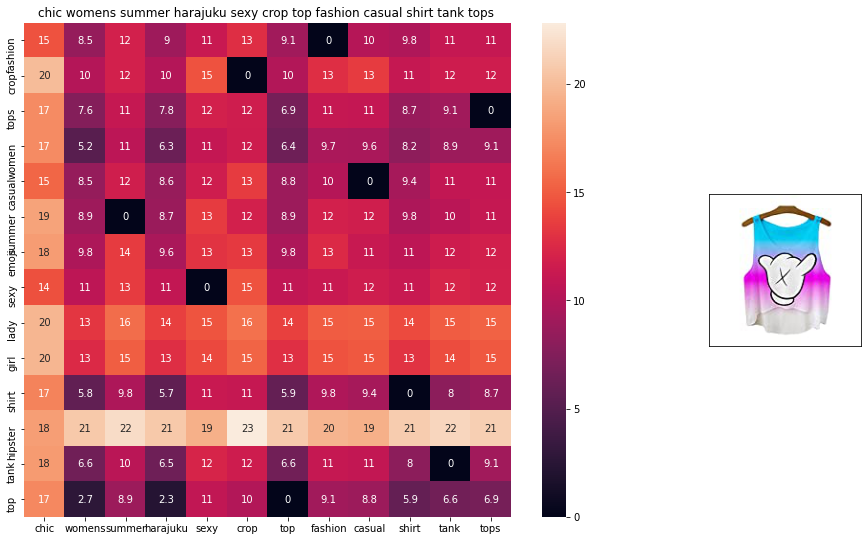

ASIN : B011RCJEMO
Brand : Chiclook Cool
euclidean distance from input : 2.3378792


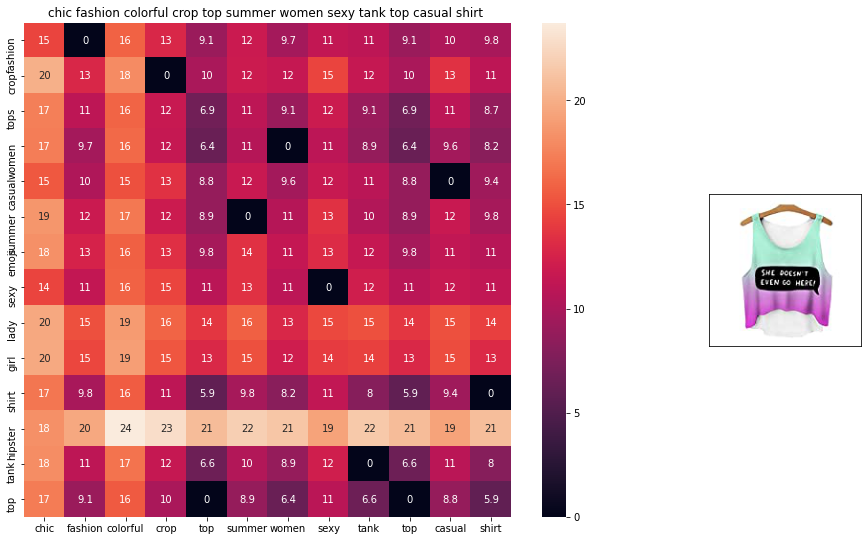

ASIN : B011RCJ6UE
Brand : Chiclook Cool
euclidean distance from input : 2.5151837


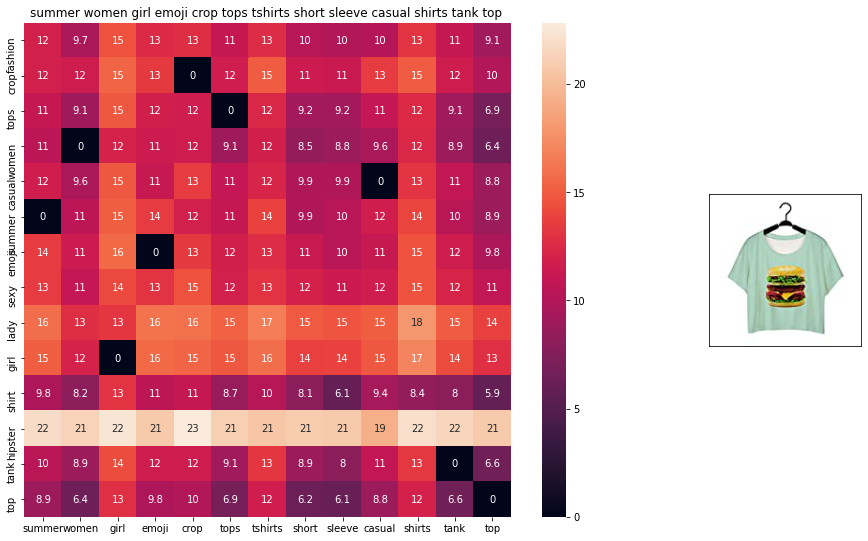

ASIN : B0124ECIU4
Brand : Doxi Supermall
euclidean distance from input : 2.5520847


In [69]:
def weighted_w2v_model(doc_id, num_results):
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

weighted_w2v_model(12566, 20)

In [70]:
from scipy.sparse import hstack

In [71]:
data['brand'].fillna(value="Not given", inplace=True )

brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

In [72]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]],
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]]
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] 
    
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    plotly.offline.iplot(table, filename='simple_table')
    
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    ax1 = plt.subplot(gs[:, :-5])
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    ax1.set_xticklabels(sentance2.split())
    ax1.set_yticklabels(sentance1.split())
    ax1.set_title(sentance2)

    ax2 = plt.subplot(gs[:, 10:16])
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    display_img(url, ax2, fig)
    
    plt.show()

In [73]:
import plotly
import plotly.figure_factory as ff

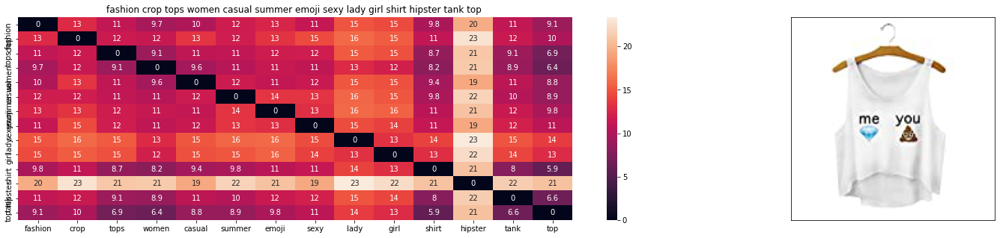

ASIN : B010V3B44G
Brand : Doxi Supermall
euclidean distance from input : 0.0


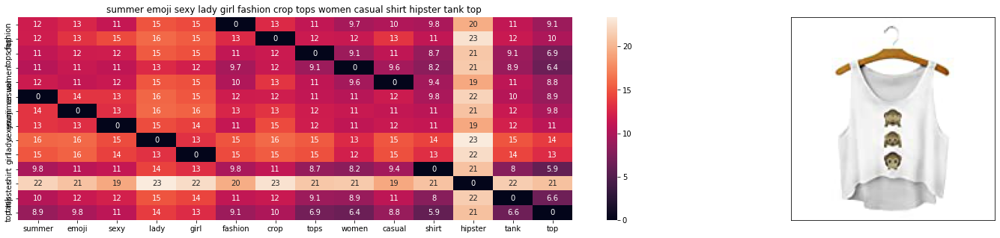

ASIN : B010V3BDII
Brand : Doxi Supermall
euclidean distance from input : 1.365714069834212e-07


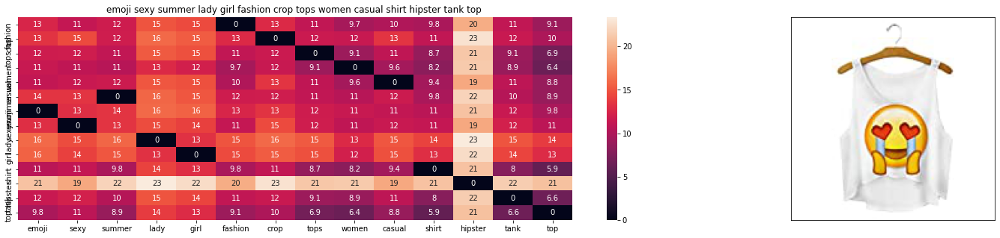

ASIN : B010V3BLWQ
Brand : Doxi Supermall
euclidean distance from input : 1.3978528841107617e-07


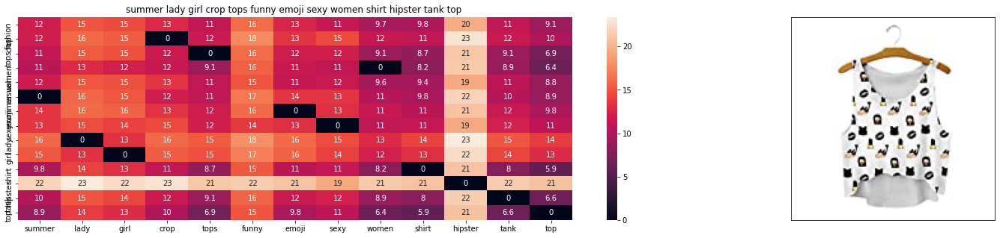

ASIN : B010V3BVMQ
Brand : Doxi Supermall
euclidean distance from input : 0.6765236377716064


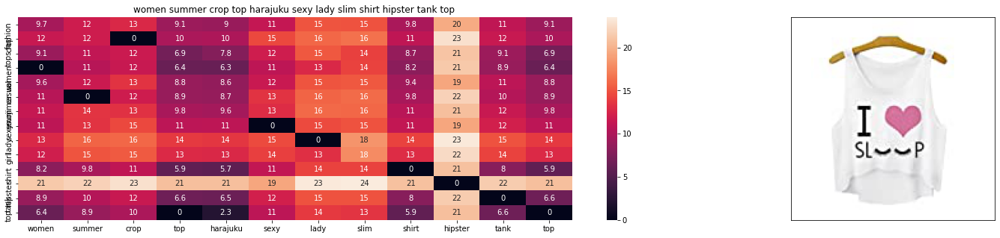

ASIN : B010V3EDEE
Brand : Doxi Supermall
euclidean distance from input : 0.871707534790039


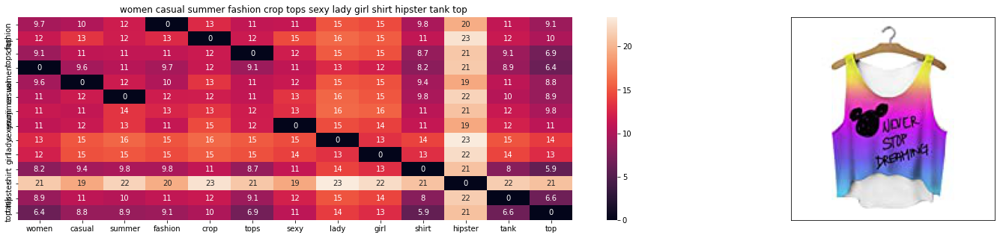

ASIN : B010V3AYSS
Brand : Doxi Supermall
euclidean distance from input : 1.0552227260489133


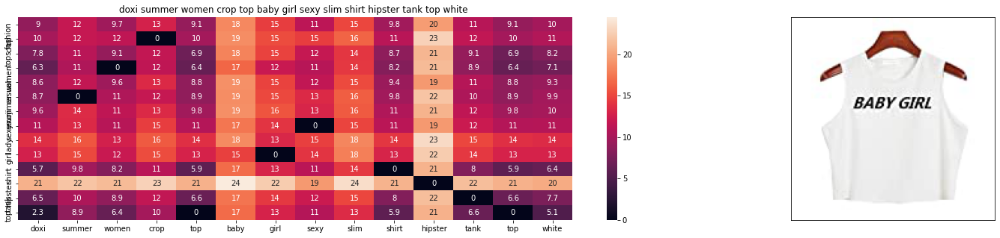

ASIN : B010V3A23U
Brand : Doxi Supermall
euclidean distance from input : 1.0621837615966796


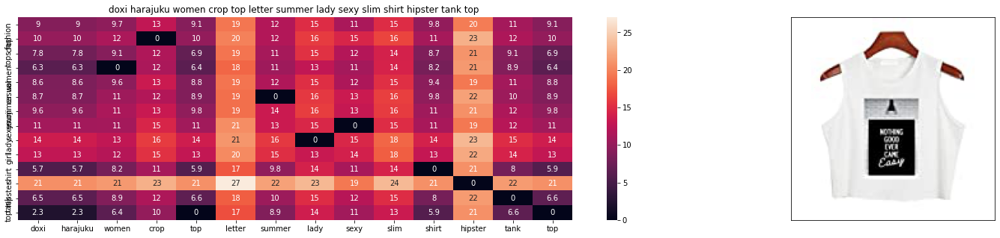

ASIN : B010V380LQ
Brand : Doxi Supermall
euclidean distance from input : 1.0837457656860352


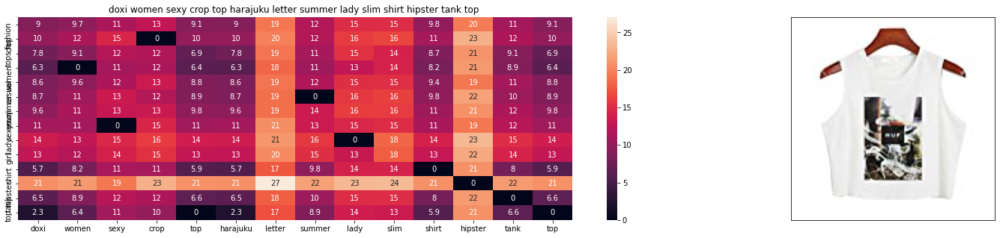

ASIN : B010V39146
Brand : Doxi Supermall
euclidean distance from input : 1.0837457656860352


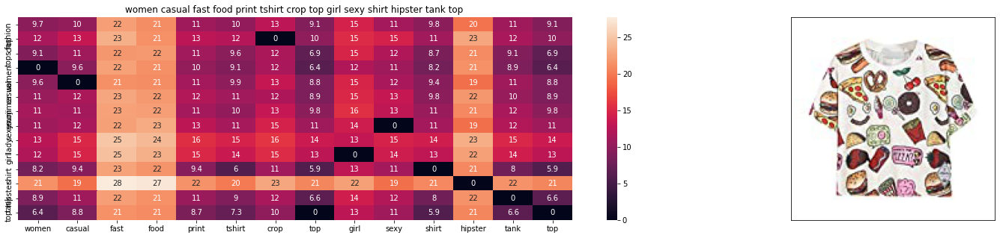

ASIN : B010V3AB5O
Brand : Doxi Supermall
euclidean distance from input : 1.3135894775390624


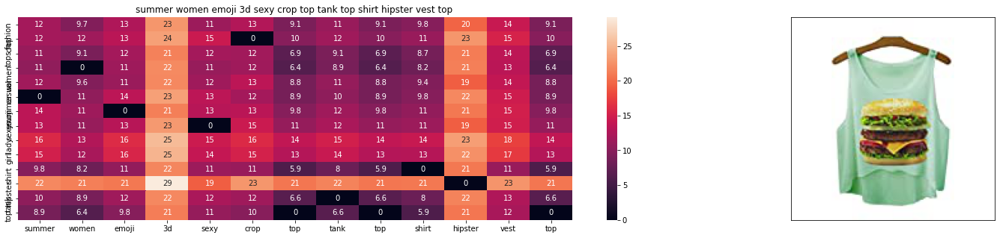

ASIN : B010V3E5EC
Brand : Doxi Supermall
euclidean distance from input : 1.3397350311279297


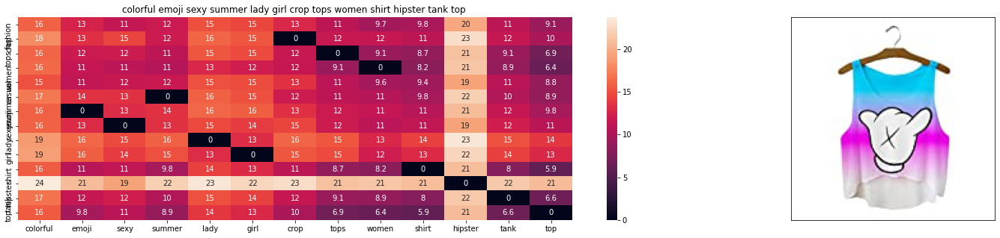

ASIN : B010V3BQZS
Brand : Doxi Supermall
euclidean distance from input : 1.3507427217383055


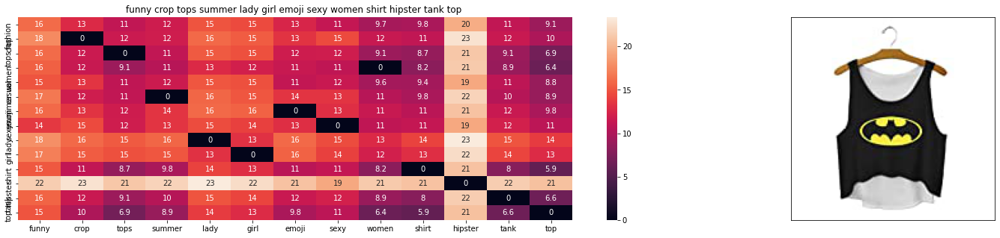

ASIN : B010V3C116
Brand : Doxi Supermall
euclidean distance from input : 1.3836304666418697


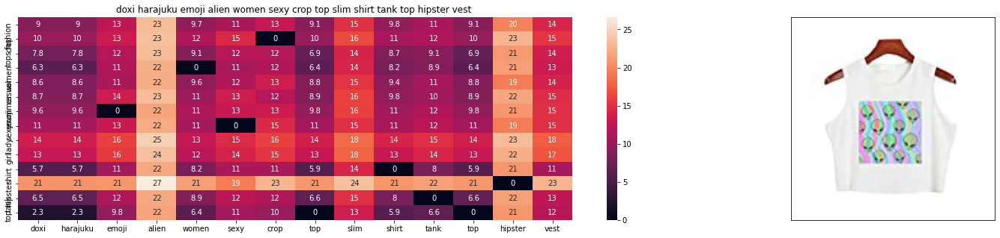

ASIN : B010TKXAI4
Brand : Doxi Supermall
euclidean distance from input : 1.387600803375244


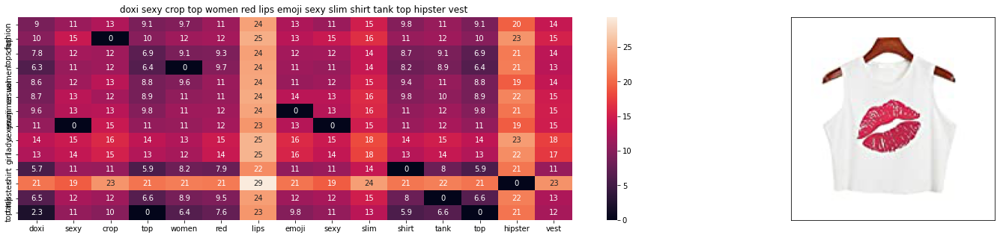

ASIN : B010TKXEHG
Brand : Doxi Supermall
euclidean distance from input : 1.4269560813903808


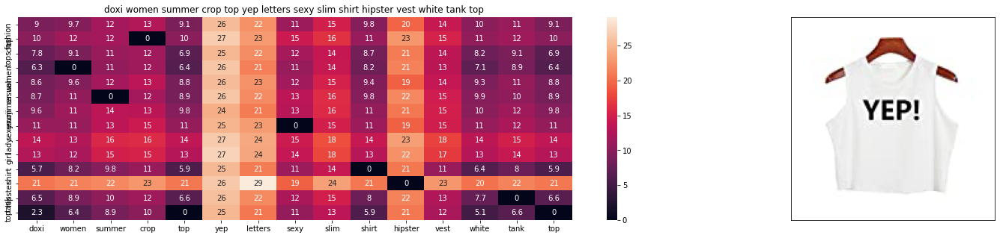

ASIN : B010V3487Q
Brand : Doxi Supermall
euclidean distance from input : 1.4681865692138671


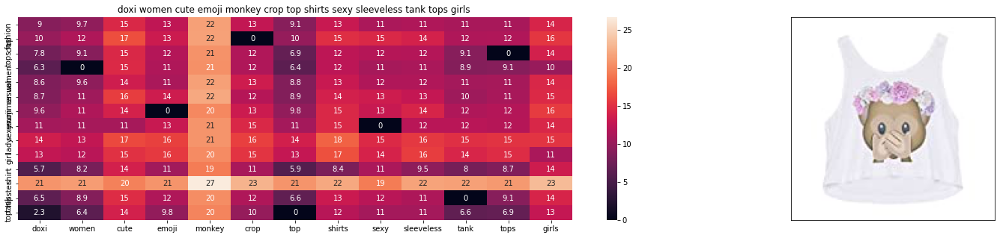

ASIN : B01LF90QTO
Brand : Doxi Supermall
euclidean distance from input : 1.4761534690856934


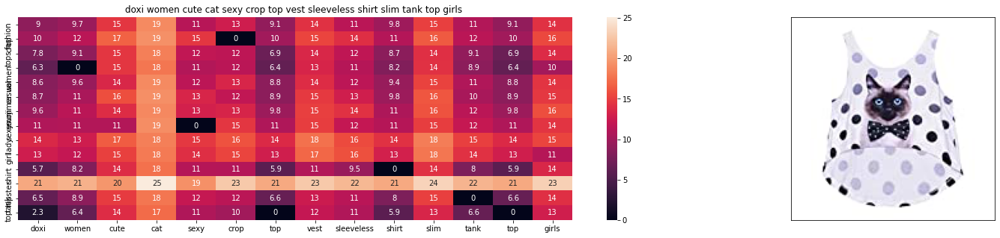

ASIN : B01LF90ROI
Brand : Doxi Supermall
euclidean distance from input : 1.482174777984619


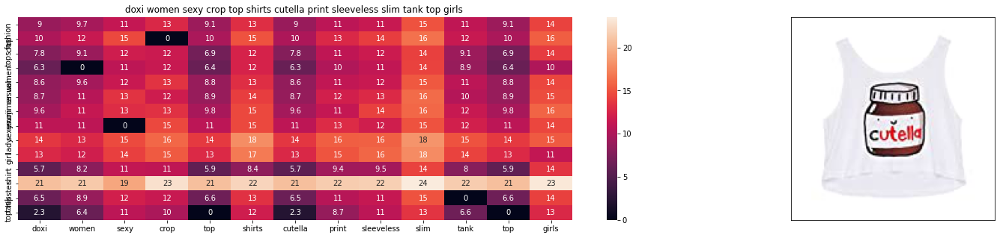

ASIN : B01LF90RKC
Brand : Doxi Supermall
euclidean distance from input : 1.5058938980102539


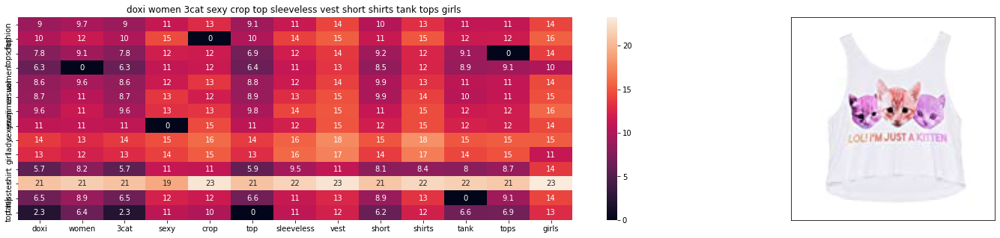

ASIN : B01LY4GQY0
Brand : Doxi Supermall
euclidean distance from input : 1.509817886352539


In [74]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12566, 5, 5, 20)

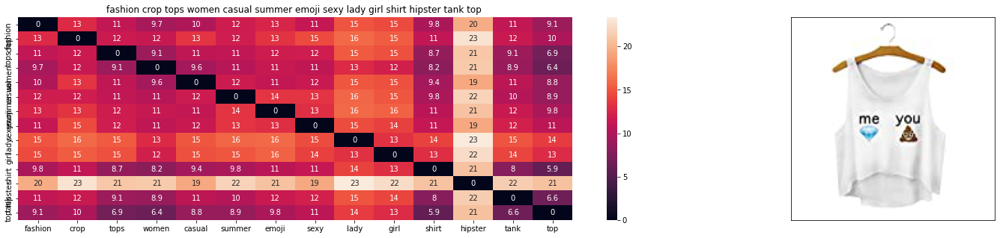

ASIN : B010V3B44G
Brand : Doxi Supermall
euclidean distance from input : 0.0


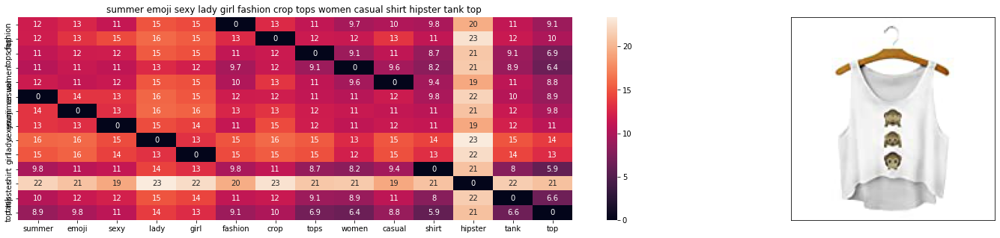

ASIN : B010V3BDII
Brand : Doxi Supermall
euclidean distance from input : 2.483116490607658e-08


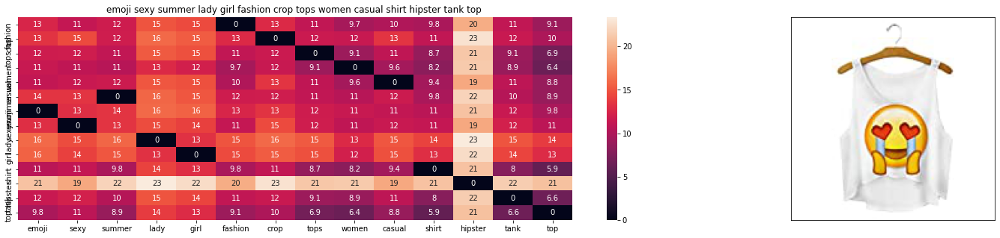

ASIN : B010V3BLWQ
Brand : Doxi Supermall
euclidean distance from input : 2.5415506983832033e-08


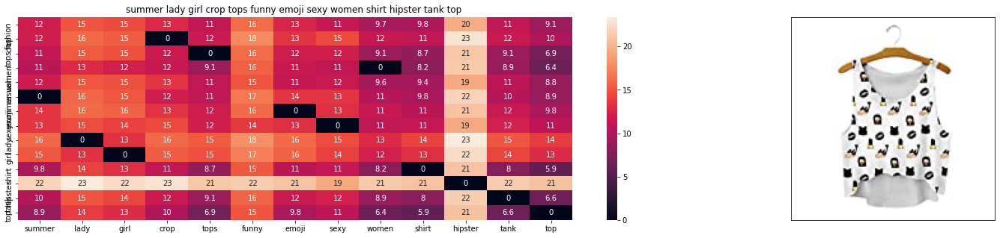

ASIN : B010V3BVMQ
Brand : Doxi Supermall
euclidean distance from input : 0.12300429777665571


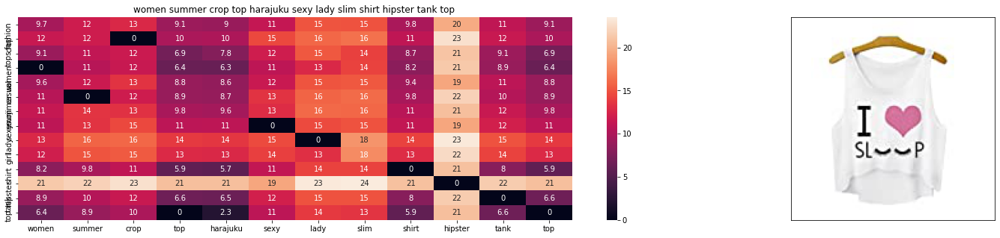

ASIN : B010V3EDEE
Brand : Doxi Supermall
euclidean distance from input : 0.15849227905273439


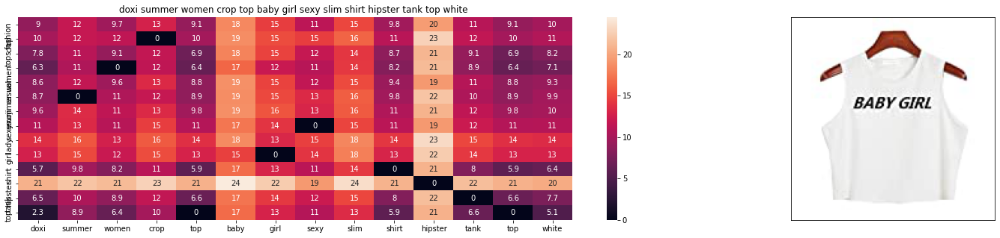

ASIN : B010V3A23U
Brand : Doxi Supermall
euclidean distance from input : 0.1931243202903054


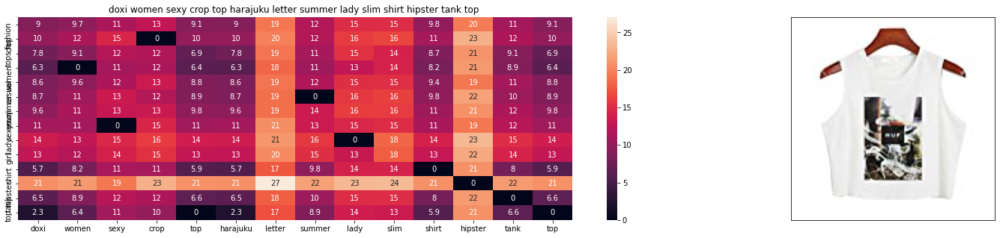

ASIN : B010V39146
Brand : Doxi Supermall
euclidean distance from input : 0.1970446846701882


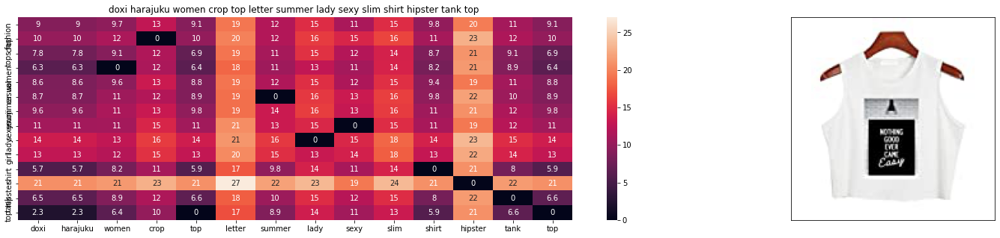

ASIN : B010V380LQ
Brand : Doxi Supermall
euclidean distance from input : 0.1970446846701882


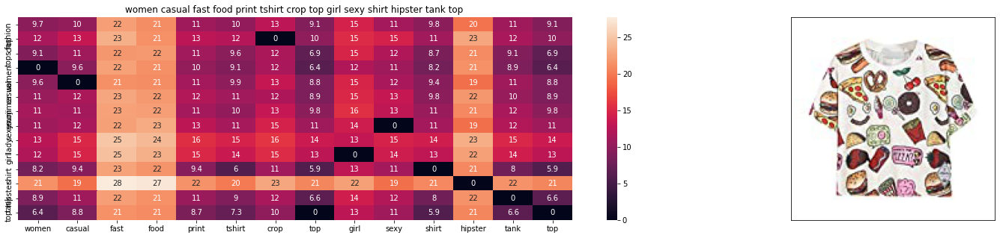

ASIN : B010V3AB5O
Brand : Doxi Supermall
euclidean distance from input : 0.23883445046164772


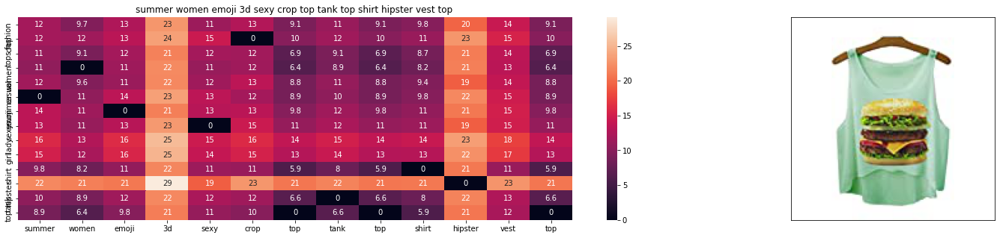

ASIN : B010V3E5EC
Brand : Doxi Supermall
euclidean distance from input : 0.2435881874778054


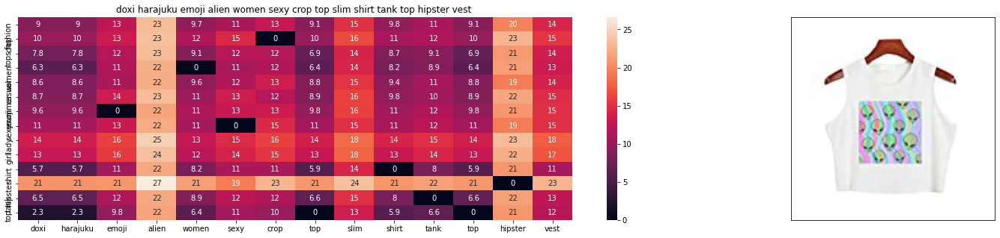

ASIN : B010TKXAI4
Brand : Doxi Supermall
euclidean distance from input : 0.2522910551591353


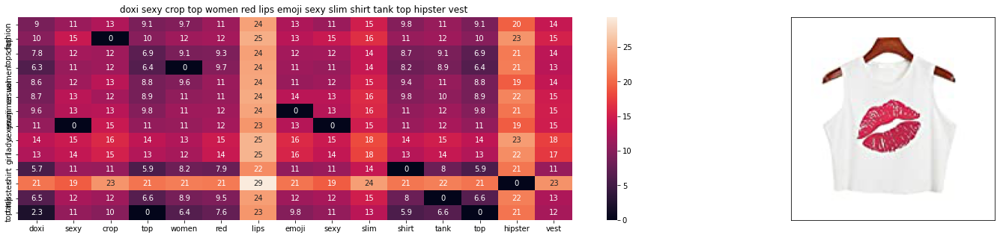

ASIN : B010TKXEHG
Brand : Doxi Supermall
euclidean distance from input : 0.2594465602527965


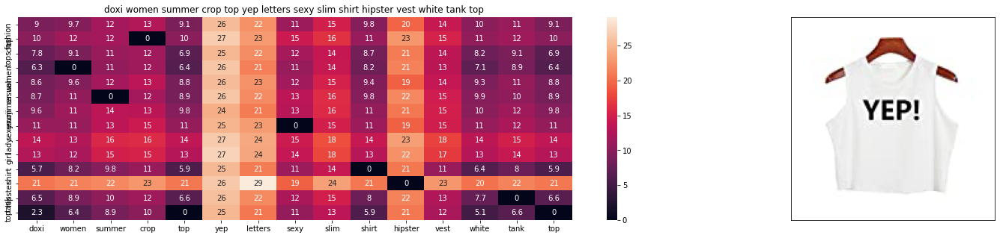

ASIN : B010V3487Q
Brand : Doxi Supermall
euclidean distance from input : 0.2669430125843395


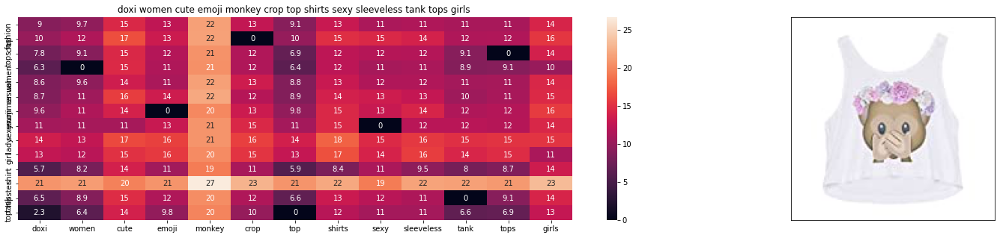

ASIN : B01LF90QTO
Brand : Doxi Supermall
euclidean distance from input : 0.2683915398337624


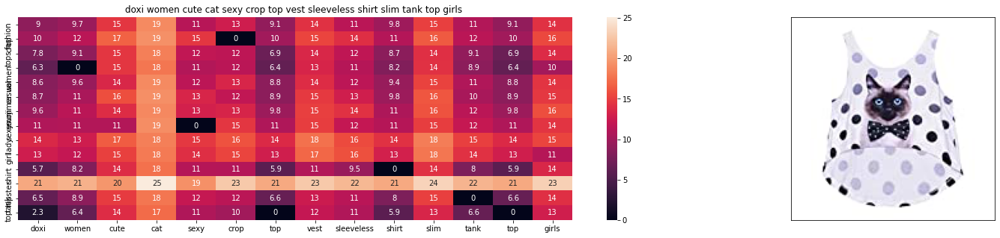

ASIN : B01LF90ROI
Brand : Doxi Supermall
euclidean distance from input : 0.26948632326993077


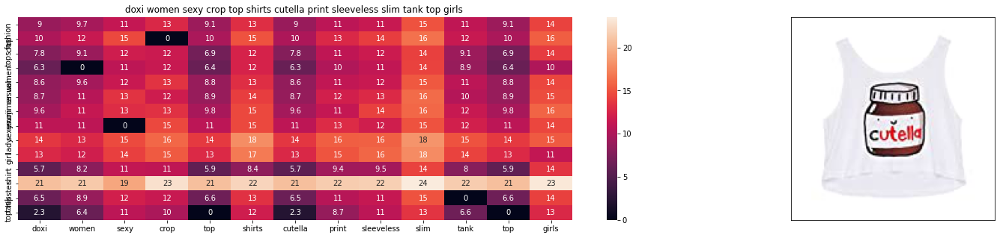

ASIN : B01LF90RKC
Brand : Doxi Supermall
euclidean distance from input : 0.2737988905473189


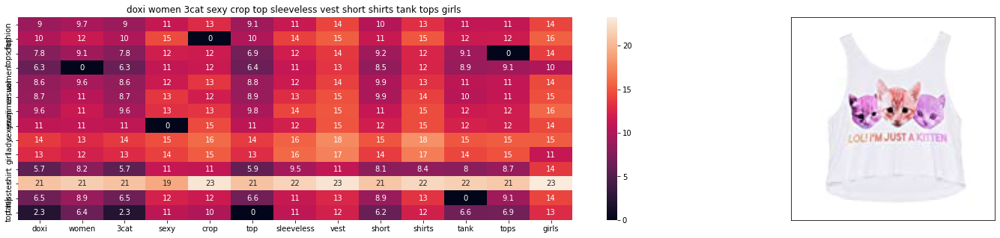

ASIN : B01LY4GQY0
Brand : Doxi Supermall
euclidean distance from input : 0.27451234297318894


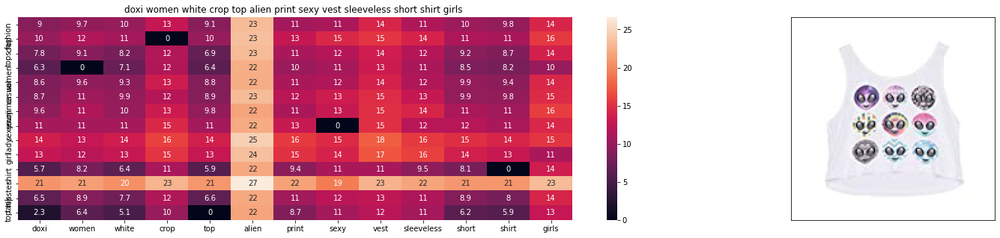

ASIN : B01LF90SCY
Brand : Doxi Supermall
euclidean distance from input : 0.28159143274480647


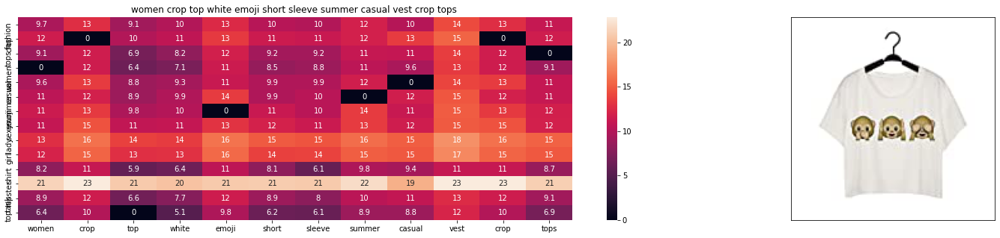

ASIN : B0124E7MHS
Brand : Doxi Supermall
euclidean distance from input : 0.2871342398903587


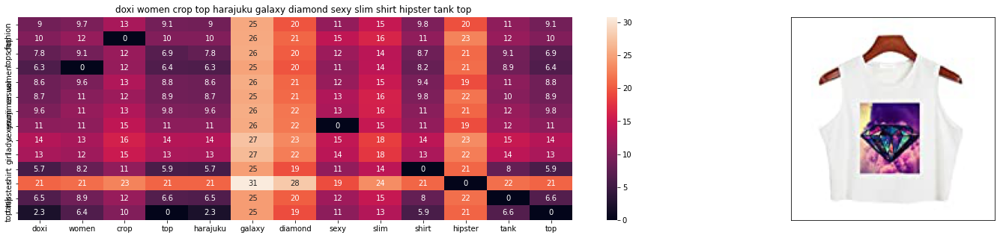

ASIN : B010V39EUM
Brand : Doxi Supermall
euclidean distance from input : 0.30813397494229405


In [75]:
idf_w2v_brand(12566, 5, 50, 20)

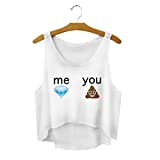

Product Title:  fashion crop tops women casual summer emoji sexy lady girl shirt hipster tank top 
Euclidean Distance from input image: 3.8146973e-06
Amazon Url: www.amzon.com/dp/B010V3B44G


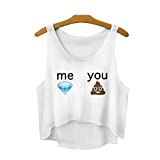

Product Title:  chic women harajuku fashion funny emoji sexy crop tops sleeveless vest shirt 
Euclidean Distance from input image: 18.585749
Amazon Url: www.amzon.com/dp/B011RCJNL6


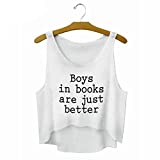

Product Title:  women quotes boys print white sleeveless crop top 
Euclidean Distance from input image: 22.04546
Amazon Url: www.amzon.com/dp/B0748CKWF3


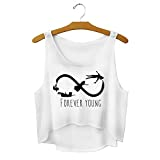

Product Title:  women forever young print white sleeveless crop top 
Euclidean Distance from input image: 22.321218
Amazon Url: www.amzon.com/dp/B0748CDWPH


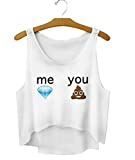

Product Title:  kingde self confident stretch vest tshirt suspendersbqn46 
Euclidean Distance from input image: 22.724632
Amazon Url: www.amzon.com/dp/B015H2R3SC


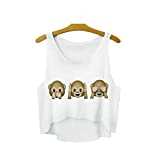

Product Title:  women three wise monkeys emoji print sleeveless crop top 
Euclidean Distance from input image: 24.452633
Amazon Url: www.amzon.com/dp/B074VPC98H


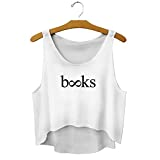

Product Title:  women infinity books print white sleeveless crop top 
Euclidean Distance from input image: 25.067362
Amazon Url: www.amzon.com/dp/B074TYKHPL


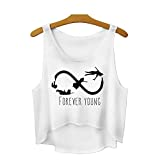

Product Title:  ladies crop top emoji women never grow shirt vest style tank tops 
Euclidean Distance from input image: 26.787249
Amazon Url: www.amzon.com/dp/B013SPUM7O


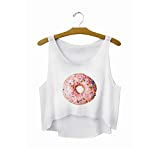

Product Title:  women fashion giant pink donut printed white sleeveless crop top 
Euclidean Distance from input image: 28.364748
Amazon Url: www.amzon.com/dp/B017Q4BOCA


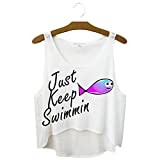

Product Title:  women keep swimming print sleeveless crop top 
Euclidean Distance from input image: 29.022312
Amazon Url: www.amzon.com/dp/B0749CCCY4


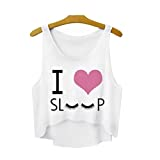

Product Title:  women summer crop top harajuku sexy lady slim shirt hipster tank top 
Euclidean Distance from input image: 29.029295
Amazon Url: www.amzon.com/dp/B010V3EDEE


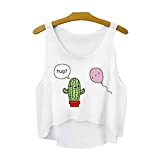

Product Title:  women fashion wanna hug printed white sleeveless crop top 
Euclidean Distance from input image: 29.049513
Amazon Url: www.amzon.com/dp/B017R0CDOQ


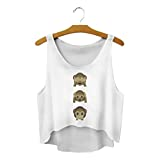

Product Title:  summer emoji sexy lady girl fashion crop tops women casual shirt hipster tank top 
Euclidean Distance from input image: 29.482378
Amazon Url: www.amzon.com/dp/B010V3BDII


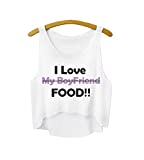

Product Title:  women fashion love food printed white crop top 
Euclidean Distance from input image: 29.615349
Amazon Url: www.amzon.com/dp/B017K0DQZ8


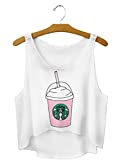

Product Title:  kingde slim starbucks coffee small vest tshirt sling stretchbqn53 
Euclidean Distance from input image: 29.690027
Amazon Url: www.amzon.com/dp/B015H2QWY8


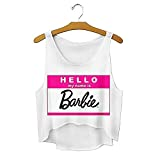

Product Title:  women fashion cute word printed name barbie sleeveless crop top 
Euclidean Distance from input image: 29.862371
Amazon Url: www.amzon.com/dp/B01AK8SC10


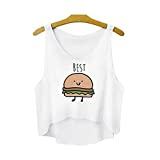

Product Title:  women fashion best friends printed best pattern one sleeveless crop top 
Euclidean Distance from input image: 29.954865
Amazon Url: www.amzon.com/dp/B01GFJOGUE


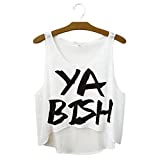

Product Title:  women yabish print white sleeveless crop top 
Euclidean Distance from input image: 30.084488
Amazon Url: www.amzon.com/dp/B0748JNFL9


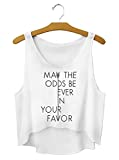

Product Title:  women fashion cool quote printed sleeveless crop top 
Euclidean Distance from input image: 30.100615
Amazon Url: www.amzon.com/dp/B018RVK1FM


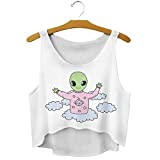

Product Title:  women pattern 8 cute baby alien print sleeveless crop top 
Euclidean Distance from input image: 30.18043
Amazon Url: www.amzon.com/dp/B074BNJM8S


In [76]:
bottleneck_features_train = np.load('16k_data_cnn_features.npy')
asins = np.load('16k_data_cnn_feature_asins.npy')
asins = list(asins)

data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
df_asins = list(data['asin'])


from IPython.display import display, Image, SVG, Math, YouTubeVideo

def get_similar_products_cnn(doc_id, num_results):
    doc_id = asins.index(df_asins[doc_id])
    pairwise_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    for i in range(len(indices)):
        rows = data[['medium_image_url','title']].loc[data['asin']==asins[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amzon.com/dp/'+ asins[indices[i]])

get_similar_products_cnn(12566, 20)
